# ITADAKI - Recipe Image Retrieval (RAW)
## EfficientNet (gelé) pour retrouver les top-3 recettes similaires à partir d'une image



**Objectif**: 
- Analyse exploratoire du dataset
- Tester l'extraction d'embedding et la recherche par similarité avec EfficientNet gelé

**Bloc C5**:
- C1 : Préparer des données non structurées en les convertissant en données numériques et sous forme tabulaires pour servir de données d'entraînement à un algorithme d’apprentissage profond.
- C2 : Sélectionner l’algorithme d’apprentissage profond le plus adapté en comparant les performances et les caractéristiques des différentes familles d’algorithmes afin d'apporter une réponse pertinente adaptée à la problématique métier rencontrée.
- C3 : Entraîner un modèle d'apprentissage profond en optimisant une loss function (fonction de coût) à partir des données d’entraînement afin de permettre à l’algorithme d’effectuer le moins d’erreurs possibles selon des indicateurs de succès clairement définis.
- C4 : Déployer efficacement un modèle d'apprentissage profond en utilisant des outils et plateformes de production adaptés (MLOps), pour assurer une accessibilité et une performance optimale des prédictions de l'algorithme aux utilisateurs finaux.

---


## 1. Imports et config

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import random
from PIL import Image
import re
import warnings
warnings.filterwarnings('ignore')

# Dark theme
plt.style.use('dark_background')
sns.set_palette("husl")

# Seed pour reproductibilité
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# HYPERPARAMETRES - Recipe Image Retrieval avec EfficientNet
CONFIG = {
    # === IMAGE PARAMETERS ===
    'IMG_SIZE': 224,                    # Optimal pour EfficientNet
    'BATCH_SIZE': 32,                   # Bon équilibre mémoire/performance
    
    # === EMBEDDING PARAMETERS ===
    'EMBEDDING_DIM_NATIVE': 1280,       #  EfficientNet features natives
    'EMBEDDING_DIM_CUSTOM': 512,        #  Custom head output (si fine-tuning)
    
    # === PHASE 1: FEATURE EXTRACTION ===
    'USE_NATIVE_FEATURES': True,        #  True = 1280-dim, False = 512-dim custom
    
    # === PHASE 2: TRANSFER LEARNING ===
    'TRANSFER_EPOCHS': 10,              #  Entraînement head seulement
    'TRANSFER_LR': 0.001,               #  Learning rate plus élevé pour nouvelles couches
    'TRANSFER_BATCH_SIZE': 16,          #  Plus petit pour stabilité
    
    # === PHASE 3: FINE-TUNING ===
    'FINETUNE_EPOCHS': 15,              #  Fine-tuning complet
    'FINETUNE_LR': 0.0001,              #  Learning rate faible pour pré-entraîné
    'FINETUNE_UNFREEZE_LAYERS': 20,     #  Nombre de couches à dégeler
    
    # === TRAINING PARAMETERS ===
    'TRIPLET_MARGIN': 0.3,              #  Augmenté pour meilleure séparation
    'DROPOUT_RATE': 0.3,                #  Régularisation
    'WEIGHT_DECAY': 0.0001,             #  L2 regularization
    
    # === OPTIMIZATION ===
    'OPTIMIZER': 'adam',                #  Standard
    'PATIENCE': 5,                      #  Early stopping
    'REDUCE_LR_PATIENCE': 3,            #  Réduction LR
    'REDUCE_LR_FACTOR': 0.5,            #  Facteur réduction
    
    # === DATA AUGMENTATION ===
    'USE_AUGMENTATION': True,           #  Pour fine-tuning
    'ROTATION_RANGE': 15,               #  Rotation aléatoire
    'ZOOM_RANGE': 0.1,                  #  Zoom aléatoire
    'HORIZONTAL_FLIP': True,            #  Flip horizontal
    
    # === EVALUATION ===
    'SIMILARITY_THRESHOLD': 0.7,       #  Seuil similarité
    'TOP_K_RESULTS': 3,                 #  Nombre résultats retournés
    'VALIDATION_SPLIT': 0.2,           #  Split pour validation
}

#  CONFIGS SPÉCIFIQUES PAR PHASE
CONFIG_PHASE1 = {**CONFIG, **{
    'MODE': 'feature_extraction',
    'EMBEDDING_DIM': CONFIG['EMBEDDING_DIM_NATIVE'],
    'TRAINABLE': False
}}

print("Configuration adaptée pour EfficientNet")
print(f"Phase 1: extraction d'embedding simple ({CONFIG['EMBEDDING_DIM_NATIVE']}-dim)")

print("Imports et configuration OK!")
print(f"TensorFlow: {tf.__version__}")
print(f"GPU: {tf.config.list_physical_devices('GPU')}")


Configuration adaptée pour EfficientNet
Phase 1: extraction d'embedding simple (1280-dim)
Imports et configuration OK!
TensorFlow: 2.19.0
GPU: []


##  2. Chargement du dataset

In [2]:
try:
    import kagglehub
    dataset_path = kagglehub.dataset_download("pes12017000148/food-ingredients-and-recipe-dataset-with-images")
    print(f"Dataset téléchargé: {dataset_path}")
    
    images_dir = os.path.join(dataset_path, "Food Images", "Food Images")
    csv_files = [f for f in os.listdir(dataset_path) if f.endswith('.csv')]
    csv_path = os.path.join(dataset_path, csv_files[0]) if csv_files else None
    
    print(f"Images: {images_dir}")
    print(f"CSV: {csv_path}")
    
except ImportError:
    print("kagglehub non installé, veuillez l'installer avec: pip install kagglehub")
    exit()

# Charger le CSV
df = pd.read_csv(csv_path)
print(f"{len(df)} recettes chargées")
print(f"Colonnes: {list(df.columns)}")

# Nettoyage basique
df_clean = df.dropna(subset=['Title', 'Ingredients', 'Instructions', 'Image_Name']).copy()
print(f"Après nettoyage: {len(df_clean)} recettes")

# Créer le texte complet
def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text).lower().strip()
    text = re.sub(r'[^a-zA-Z0-9\s,.!?-]', '', text)
    text = re.sub(r'\s+', ' ', text)
    return text

df_clean['full_text'] = (
    df_clean['Title'].apply(clean_text) + ' ' + 
    df_clean['Ingredients'].apply(clean_text) + ' ' + 
    df_clean['Instructions'].apply(clean_text)
)

print("Données chargées")

Dataset téléchargé: C:\Users\Naturel\.cache\kagglehub\datasets\pes12017000148\food-ingredients-and-recipe-dataset-with-images\versions\1
Images: C:\Users\Naturel\.cache\kagglehub\datasets\pes12017000148\food-ingredients-and-recipe-dataset-with-images\versions\1\Food Images\Food Images
CSV: C:\Users\Naturel\.cache\kagglehub\datasets\pes12017000148\food-ingredients-and-recipe-dataset-with-images\versions\1\Food Ingredients and Recipe Dataset with Image Name Mapping.csv
13501 recettes chargées
Colonnes: ['Unnamed: 0', 'Title', 'Ingredients', 'Instructions', 'Image_Name', 'Cleaned_Ingredients']
Après nettoyage: 13493 recettes
Données chargées


In [3]:
print("Vérification des images...")

if not os.path.exists(images_dir):
    print(f"Dossier non trouvé: {images_dir}")
    exit()

available_images = set(os.listdir(images_dir))
print(f"{len(available_images)} images trouvées")

print("- Exemples d'images:")
for i, img in enumerate(list(available_images)[:5]):
    print(f"{img}")

print("- Exemples de noms CSV:")
for i, name in enumerate(df_clean['Image_Name'].dropna().head(5)):
    print(f"{name}")

# Fonction de correspondance
def find_image_path(image_name):
    """Trouve le chemin complet de l'image"""
    if pd.isna(image_name):
        return None
    
    # Essayer nom exact
    if image_name in available_images:
        return os.path.join(images_dir, image_name)
    
    # Essayer avec .jpg
    if f"{image_name}.jpg" in available_images:
        return os.path.join(images_dir, f"{image_name}.jpg")
    
    # Essayer avec .jpeg
    if f"{image_name}.jpeg" in available_images:
        return os.path.join(images_dir, f"{image_name}.jpeg")
    
    # Essayer avec .png
    if f"{image_name}.png" in available_images:
        return os.path.join(images_dir, f"{image_name}.png")
    
    return None

df_clean['image_path'] = df_clean['Image_Name'].apply(find_image_path)
df_clean['has_image'] = df_clean['image_path'].notna()

# Filtrer les recettes avec images
recipes_with_images = df_clean[df_clean['has_image']].copy()
print(f"\n{len(recipes_with_images)} recettes avec images conservées dans recipes_with_images")

Vérification des images...
13582 images trouvées
- Exemples d'images:
arugula-and-mint-salad-with-oil-cured-black-olives-oranges-and-ricotta-salata-236186.jpg
watermelon-granita-with-gingered-strawberries-360529.jpg
turkey-tetrazzini-13377.jpg
cucumber-sake-tini-358951.jpg
chawan-mushi-with-shrimp-and-spring-peas-51155250.jpg
- Exemples de noms CSV:
miso-butter-roast-chicken-acorn-squash-panzanella
crispy-salt-and-pepper-potatoes-dan-kluger
thanksgiving-mac-and-cheese-erick-williams
italian-sausage-and-bread-stuffing-240559
newtons-law-apple-bourbon-cocktail

13463 recettes avec images conservées dans recipes_with_images


## 3. Nettoyage NLP

In [4]:
#  Nettoyage NLP
import nltk
import pandas as pd
import re

# NLTK
print("Téléchargement des ressources NLTK...")
nltk.download('stopwords', quiet=True)
nltk.download('punkt_tab', quiet=True)  # Version récente de punkt
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)  # Pour WordNet multilingue
print("Ressources NLTK OK!")

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

# Configuration NLTK avec stop words culinaires personnalisés
stop_words = set(stopwords.words('english'))

# Stop words spécifiques à la cuisine, pourrait être amélioré
culinary_stopwords = {
    'bake',
    'baking',
    'chopped',
    'coarse',
    'coarsely',
    'cook',
    'cooking',
    'cube',
    'cubes',
    'cup',
    'cups',
    'cut',
    'diced',
    'divided',
    'finely',
    'gram',
    'grams',
    'grated',
    'halved',
    'hour',
    'hours',
    'inch',
    'inches',
    'kg',
    'lengthwise',
    'liter',
    'liters',
    'melted',
    'minute',
    'minutes',
    'minced',
    'ml',
    'oz',
    'peeled',
    'piece',
    'pieces',
    'plus',
    'pound',
    'pounds',
    'quartered',
    'recipe',
    'recipes',
    'room',
    'seeded',
    'serve',
    'serves',
    'serving',
    'servings',
    'sliced',
    'stick',
    'tablespoon',
    'tablespoons',
    'tbsp',
    'teaspoon',
    'teaspoons',
    'temperature',
    'thinly',
    'tsp',
    'trimmed'
}

# Fusionner les stop words
stop_words.update(culinary_stopwords)
print(f"Stop words enrichis: {len(stop_words)} mots au total comprenant {len(culinary_stopwords)} stop words culinaires")

lemmatizer = WordNetLemmatizer()

def clean_text_advanced(text):
    """
    Nettoyage avancé du texte avec NLTK
    """
    if pd.isna(text) or text == '':
        return ''
    
    # Convertir en string et minuscules
    text = str(text).lower()
    
    # Supprimer la ponctuation et caractères spéciaux
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Supprimer les chiffres
    text = re.sub(r'\d+', '', text)
    
    # Tokenisation
    tokens = word_tokenize(text)
    
    # Supprimer stopwords et mots courts (< 3 caractères)
    tokens = [token for token in tokens if token not in stop_words and len(token) > 2]
    
    # Lemmatisation
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
    return ' '.join(tokens)

def extract_ingredients_list(ingredients_str):
    """
    Extrait et nettoie la liste d'ingrédients depuis le format string
    """
    if pd.isna(ingredients_str):
        return []
    
    # Supprimer les crochets et guillemets
    cleaned = str(ingredients_str).strip("[]'\"")
    
    # Séparer par virgules et nettoyer
    ingredients = []
    for item in cleaned.split(','):
        item = item.strip("' \"")
        if item and len(item) > 1:
            # Nettoyer chaque ingrédient
            clean_ingredient = clean_text_advanced(item)
            if clean_ingredient:
                ingredients.append(clean_ingredient)
    
    return ingredients

# Nettoyage NLP
print("Application du nettoyage NLP...")
recipes_with_images['Title_Clean'] = recipes_with_images['Title'].apply(clean_text_advanced)
recipes_with_images['Ingredients_Clean'] = recipes_with_images['Ingredients'].apply(clean_text_advanced)
recipes_with_images['Instructions_Clean'] = recipes_with_images['Instructions'].apply(clean_text_advanced)

# Extraire la liste des ingrédients
recipes_with_images['Ingredients_List'] = recipes_with_images['Ingredients'].apply(extract_ingredients_list)

# Recréer le texte complet avec le nettoyage avancé
recipes_with_images['full_text_advanced'] = (
    recipes_with_images['Title_Clean'] + ' ' + 
    recipes_with_images['Ingredients_Clean'] + ' ' + 
    recipes_with_images['Instructions_Clean']
)

print("Nettoyage NLP terminé!")

Téléchargement des ressources NLTK...
Ressources NLTK OK!
Stop words enrichis: 257 mots au total comprenant 59 stop words culinaires
Application du nettoyage NLP...
Nettoyage NLP terminé!


## 4. Visualisation des images du dataset

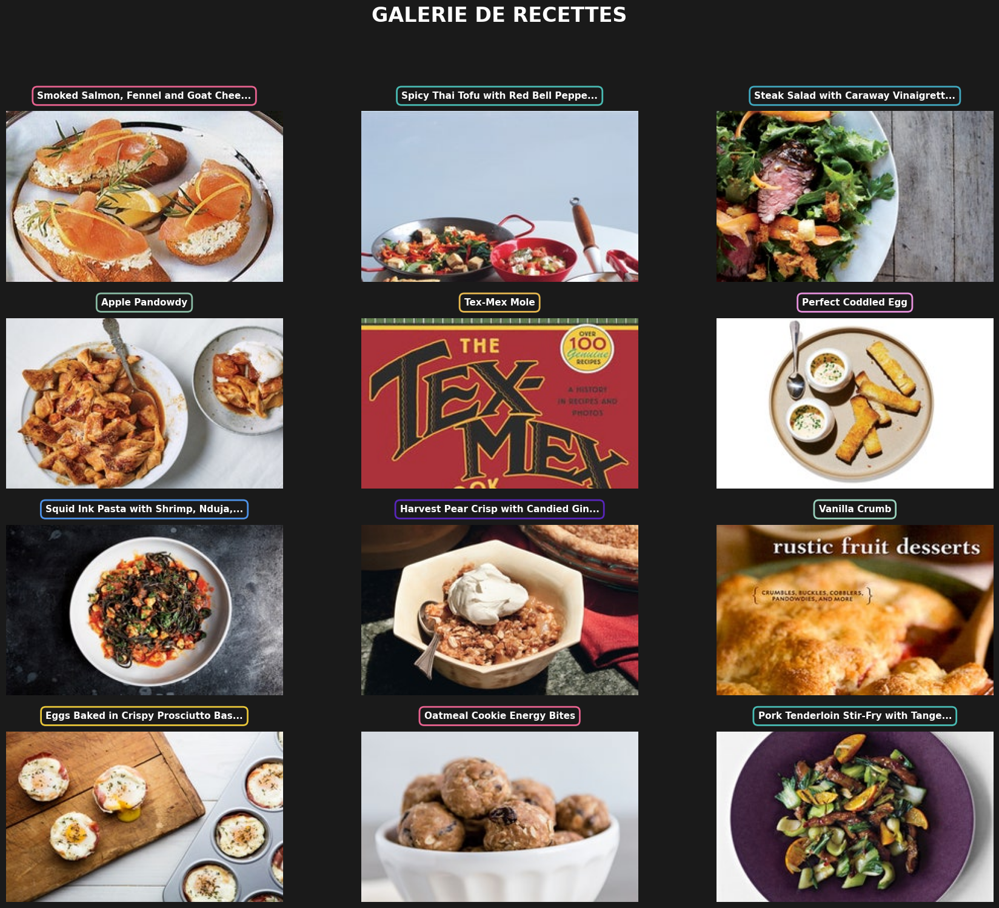


STATISTIQUES SUR LES IMAGES:
Images affichées: 12
Total recettes disponibles: 13,463
Recettes avec images: 13,463
Pourcentage avec images: 100.0%

EXEMPLES DE TITRES:
1. Smoked Salmon, Fennel and Goat Cheese Toasts
2. Spicy Thai Tofu with Red Bell Peppers and Peanuts
3. Steak Salad with Caraway Vinaigrette and Rye Croutons


In [5]:
def visualize_recipe_gallery_harmonized(recipes_df, images_dir, grid_size=(4, 3), random_seed=42):
    """
    Affiche une galerie d'images de recettes
    """
    # Configuration du style
    plt.style.use('dark_background')
    
    # Créer la figure avec le fond sombre harmonisé
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(18, 16))
    fig.patch.set_facecolor('#1a1a1a')  # Même fond que les autres visualisations
    
    # Titre principal avec style harmonisé
    fig.suptitle('GALERIE DE RECETTES', 
                 fontsize=24, fontweight='bold', color='white', y=0.98)
    
    # Aplatir les axes pour faciliter l'itération
    axes = axes.flatten()
    
    # Échantillonner des recettes aléatoirement
    total_samples = grid_size[0] * grid_size[1]
    if len(recipes_df) >= total_samples:
        sample_recipes = recipes_df.sample(n=total_samples, random_state=random_seed)
    else:
        sample_recipes = recipes_df.sample(n=len(recipes_df), random_state=random_seed)
        print(f"Seulement {len(recipes_df)} recettes disponibles (demandé: {total_samples})")
    
    # Palette de couleurs pour les bordures
    border_colors = ['#FF6B9D', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57', 
                     '#FF9FF3', '#54A0FF', '#5F27CD', '#A8E6CF', '#FFD93D']
    
    for idx, (_, recipe) in enumerate(sample_recipes.iterrows()):
        if idx >= len(axes):
            break
            
        ax = axes[idx]
        ax.set_facecolor('#2d2d2d')
        
        try:
            # Utiliser le chemin d'image déjà résolu
            image_path = recipe.get('image_path')
            
            if image_path and os.path.exists(image_path):
                # Charger et afficher l'image
                img = Image.open(image_path)
                img = img.convert('RGB')
                ax.imshow(img)
                
                # Titre tronqué si trop long
                title = recipe['Title']
                if len(title) > 35:
                    title = title[:35] + "..."
                
                border_color = border_colors[idx % len(border_colors)]
                
                ax.set_title(title, fontsize=11, fontweight='bold', 
                           color='white', pad=15,
                           bbox=dict(boxstyle="round,pad=0.5", 
                                   facecolor='#1a1a1a', 
                                   edgecolor=border_color, 
                                   linewidth=2, alpha=0.9))
                ax.axis('off')
                
                # Ajouter une bordure colorée autour de l'image
                for spine in ax.spines.values():
                    spine.set_visible(True)
                    spine.set_color(border_color)
                    spine.set_linewidth(3)
                    spine.set_alpha(0.8)
                
            else:
                # Placeholder pour images manquantes
                ax.text(0.5, 0.5, f'\n\nImage non trouvée\n\n"{recipe["Title"][:25]}..."', 
                       horizontalalignment='center', verticalalignment='center',
                       transform=ax.transAxes, fontsize=10, color='white',
                       bbox=dict(boxstyle="round,pad=0.8", 
                               facecolor='#2d2d2d', 
                               edgecolor='#FF6B9D', 
                               linewidth=2, alpha=0.9))
                ax.set_title("Image manquante", fontsize=11, color='#FF6B9D', fontweight='bold')
                ax.axis('off')
                
        except Exception as e:
            ax.text(0.5, 0.5, f'\n\nErreur de chargement\n\n{str(e)[:20]}...', 
                   horizontalalignment='center', verticalalignment='center',
                   transform=ax.transAxes, fontsize=10, color='white',
                   bbox=dict(boxstyle="round,pad=0.8", 
                           facecolor='#2d2d2d', 
                           edgecolor='#FECA57', 
                           linewidth=2, alpha=0.9))
            ax.set_title("Erreur", fontsize=11, color='#FECA57', fontweight='bold')
            ax.axis('off')
    
    # Masquer des axes non utilisés
    for idx in range(len(sample_recipes), len(axes)):
        axes[idx].set_facecolor('#1a1a1a')
        axes[idx].axis('off')
    
    plt.tight_layout(pad=3.0, rect=[0, 0.03, 1, 0.96])
    plt.show()
    
    # Statistiques
    print(f"\nSTATISTIQUES SUR LES IMAGES:")
    print(f"Images affichées: {min(len(sample_recipes), len(axes))}")
    print(f"Total recettes disponibles: {len(recipes_df):,}")
    print(f"Recettes avec images: {recipes_df['has_image'].sum():,}")
    print(f"Pourcentage avec images: {(recipes_df['has_image'].sum() / len(recipes_df) * 100):.1f}%")
    
    # Afficher quelques exemples de titres
    print(f"\nEXEMPLES DE TITRES:")
    for i, (_, recipe) in enumerate(sample_recipes.head(3).iterrows()):
        print(f"{i+1}. {recipe['Title']}")

#  Affichage de la galerie
if 'recipes_with_images' in globals() and 'images_dir' in globals():
    if len(recipes_with_images) > 0:
        visualize_recipe_gallery_harmonized(recipes_with_images, images_dir, grid_size=(4, 3))
    else:
        print("Aucune recette avec image trouvée pour la galerie")
        
else:
    print("Erreur. Assurez-vous d'avoir exécuté les cellules de chargement des données.")
    if 'recipes_with_images' not in globals():
        print("- 'recipes_with_images' non trouvé")
    if 'images_dir' not in globals():
        print("- 'images_dir' non trouvé")

## 5. Analyse exploratoire des données (recipes_with_images)

Analyse des top 20 ingrédients...
Top 20 ingrédients: ['kosher salt', 'sugar', 'salt', 'unsalted butter', 'olive oil', 'garlic clove', 'large egg', 'extravirgin olive oil', 'freshly ground black pepper', 'fresh lemon juice', 'allpurpose flour', 'water', 'vegetable oil', 'vanilla extract', 'powder', 'whole milk', 'freshly ground pepper', 'heavy cream', 'honey', 'fresh lime juice']


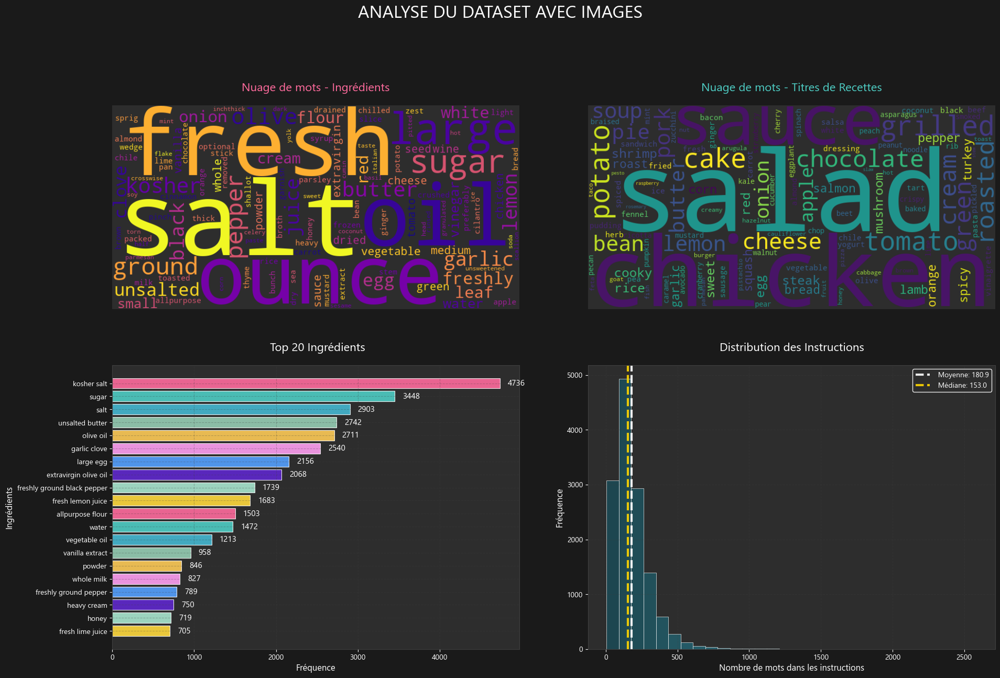


STATISTIQUES DES INSTRUCTIONS:
Longueur moyenne: 180.9 mots
Longueur médiane: 153.0 mots
Plus courte: 6 mots
Plus longue: 2587 mots

STATISTIQUES GÉNÉRALES:
Recettes avec images: 13,463
Recettes avec ingrédients: 13,463
Recettes avec instructions: 13,463
Recettes avec nettoyage avancé: 13463

ANALYSE DES TITRES EN DOUBLE:
Titres uniques: 13,104
Titres en double: 164
Total d'occurrences dupliquées: 359
Pourcentage de doublons: 1.2%

ANALYSE DES INSTRUCTIONS EN DOUBLE:
Instructions uniques: 13,419
Instructions en double: 15
Total d'occurrences dupliquées: 44
Pourcentage de doublons: 0.1%

ANALYSE DES RECETTES COMPLÈTEMENT IDENTIQUES:
Recettes complètement uniques: 13,441
Recettes complètement identiques: 8
Total de recettes dupliquées: 22


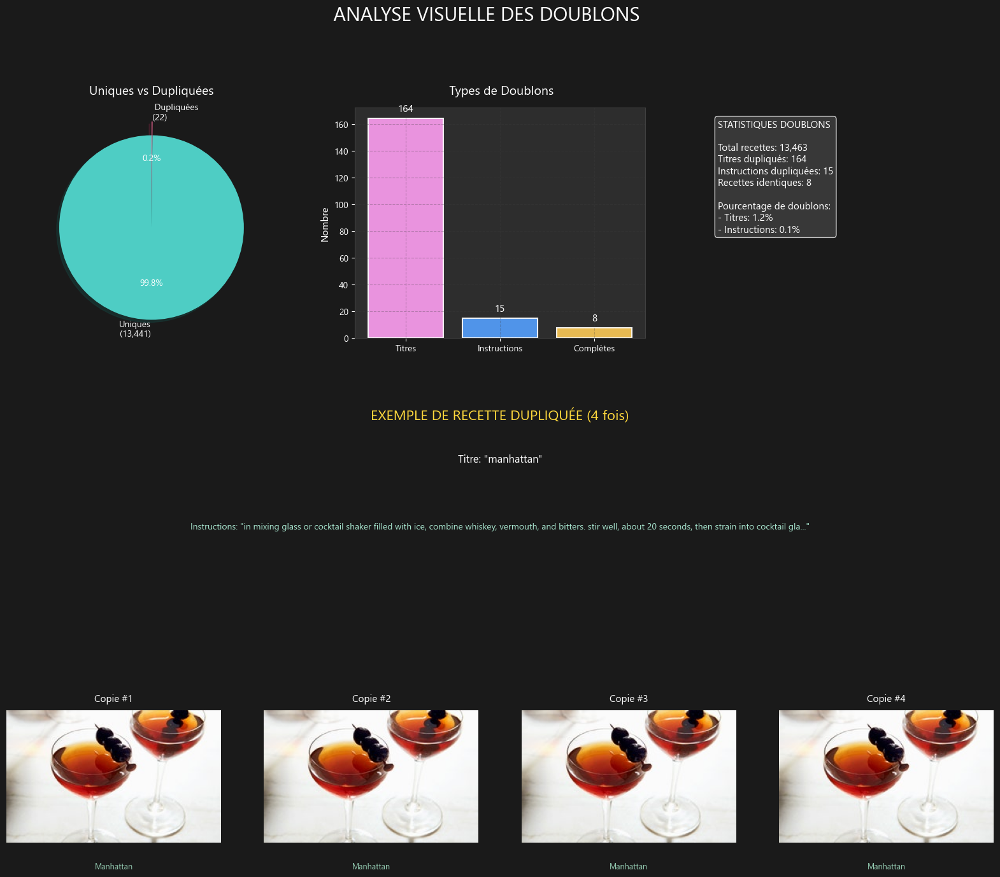

Toutes les visualisations et l'analyse des doublons sont OK!


In [6]:


import platform
from wordcloud import WordCloud

# Configuration  dark theme
plt.style.use('dark_background')
plt.rcParams['font.family'] = ['Segoe UI Emoji', 'Apple Color Emoji', 'Noto Color Emoji', 'DejaVu Sans', 'sans-serif']
plt.rcParams['axes.unicode_minus'] = False

if platform.system() == "Windows":
    plt.rcParams['font.family'] = ['Segoe UI Emoji', 'DejaVu Sans', 'sans-serif']
elif platform.system() == "Linux":
    plt.rcParams['font.family'] = ['Noto Color Emoji', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
elif platform.system() == "Darwin":  # macOS
    plt.rcParams['font.family'] = ['Apple Color Emoji', 'SF Pro Display', 'DejaVu Sans', 'sans-serif']
else:
    plt.rcParams['font.family'] = ['DejaVu Sans', 'sans-serif']

plt.rcParams['axes.unicode_minus'] = False
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib.font_manager')

# Palette de couleurs magnifique (IDENTIQUE)
beautiful_colors = ['#FF6B9D', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57', '#FF9FF3', '#54A0FF', '#5F27CD', '#A8E6CF', '#FFD93D']

def create_wordcloud_harmonized(text_data, title, max_words=100, colormap='viridis'):
    """
    Crée un nuage de mots
    """
    # Combiner tout le texte
    if isinstance(text_data, list):
        combined_text = ' '.join([str(text) for text in text_data if pd.notna(text) and str(text).strip()])
    else:
        combined_text = ' '.join([str(text) for text in text_data.dropna() if str(text).strip()])
    
    if not combined_text.strip():
        print(f" Pas de données texte pour {title}")
        return None
    
    # Créer le WordCloud avec le style harmonisé
    wordcloud = WordCloud(
        width=800, 
        height=400, 
        background_color='#2d2d2d',  # Même fond que les autres graphiques
        max_words=max_words,
        colormap=colormap,
        collocations=False,
        prefer_horizontal=0.7
    ).generate(combined_text)
    
    return wordcloud

def plot_top_ingredients_harmonized(recipes_df, ax, top_n=20):
    """
    Graphique des ingrédients
    """
    ax.set_facecolor('#2d2d2d')  # Même fond
    
    # Compter tous les ingrédients
    all_ingredients = []
    
    if 'Ingredients_List' in recipes_df.columns:
        for ingredients_list in recipes_df['Ingredients_List'].dropna():
            if isinstance(ingredients_list, list):
                all_ingredients.extend(ingredients_list)
    else:
        # Fallback: extraire depuis la colonne Ingredients
        for ingredients_text in recipes_df['Ingredients'].dropna():
            if pd.notna(ingredients_text) and str(ingredients_text).strip():
                ingredients = [ing.strip().lower() for ing in str(ingredients_text).split(',')]
                all_ingredients.extend([ing for ing in ingredients if len(ing) > 2])
    
    if not all_ingredients:
        ax.text(0.5, 0.5, " Aucun ingrédient trouvé", ha='center', va='center', 
                transform=ax.transAxes, color='white', fontsize=12)
        return None
    
    # Compter les fréquences
    from collections import Counter
    ingredient_counts = Counter(all_ingredients)
    top_ingredients = ingredient_counts.most_common(top_n)
    
    if not top_ingredients:
        return None
    
    # Créer le graphique avec le style harmonisé
    ingredients, counts = zip(*top_ingredients)
    
    # Utiliser la palette magnifique
    colors = [beautiful_colors[i % len(beautiful_colors)] for i in range(len(ingredients))]
    
    bars = ax.barh(range(len(ingredients)), counts, 
                   color=colors, alpha=0.9, 
                   edgecolor='white', linewidth=0.8)  # Bordures plus fines
    
    ax.set_xlabel('Fréquence', fontweight='bold', color='white', fontsize=12)
    ax.set_ylabel('Ingrédients', fontweight='bold', color='white', fontsize=12)
    ax.set_title(f' Top {top_n} Ingrédients', fontweight='bold', fontsize=16, color='white', pad=20)
    ax.set_yticks(range(len(ingredients)))
    ax.set_yticklabels(ingredients, fontsize=10, color='white')
    ax.tick_params(colors='white')
    
    # Ajouter les valeurs avec style
    for bar, count in zip(bars, counts):
        ax.text(bar.get_width() + max(counts)*0.02, bar.get_y() + bar.get_height()/2, 
                str(count), ha='left', va='center', fontweight='bold', 
                color='white', fontsize=11)
    
    # Style harmonisé
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, color='#404040', linestyle='--')
    ax.spines['bottom'].set_color('#404040')
    ax.spines['top'].set_color('#404040')
    ax.spines['right'].set_color('#404040')
    ax.spines['left'].set_color('#404040')
    
    return top_ingredients

def plot_instruction_lengths_harmonized(recipes_df, ax):
    """
    Distribution des longueurs des instructions
    """
    ax.set_facecolor('#2d2d2d')
    
    instruction_lengths = recipes_df['Instructions'].dropna().apply(lambda x: len(str(x).split()))
    
    # Histogramme
    n, bins, patches = ax.hist(instruction_lengths, bins=30, alpha=0.9, 
                              edgecolor='white', linewidth=0.5)
    
    base_color = np.array([69, 183, 209])
    for i, patch in enumerate(patches):
        intensity = 0.4 + 0.6 * (i / len(patches))
        color = base_color * intensity / 255.0
        patch.set_facecolor(color)
    
    ax.set_xlabel('Nombre de mots dans les instructions', fontweight='bold', color='white', fontsize=12)
    ax.set_ylabel('Fréquence', fontweight='bold', color='white', fontsize=12) 
    ax.set_title('Distribution des Instructions', fontweight='bold', fontsize=16, color='white', pad=20)
    ax.tick_params(colors='white')
    
    # Statistiques avec couleurs contrastantes pour la lisibilité
    mean_length = instruction_lengths.mean()
    median_length = instruction_lengths.median()
    ax.axvline(mean_length, color='#FFFFFF', linestyle='--', linewidth=3, alpha=0.9, label=f' Moyenne: {mean_length:.1f}')
    ax.axvline(median_length, color='#FFD700', linestyle='--', linewidth=3, alpha=0.9, label=f' Médiane: {median_length:.1f}')
    
    # Légende harmonisée
    legend = ax.legend(framealpha=0.9, facecolor='#2d2d2d', edgecolor='white')
    for text in legend.get_texts():
        text.set_color('white')
    
    ax.grid(True, alpha=0.3, color='#404040', linestyle='--')
    ax.spines['bottom'].set_color('#404040')
    ax.spines['top'].set_color('#404040')
    ax.spines['right'].set_color('#404040')
    ax.spines['left'].set_color('#404040')
    
    return instruction_lengths

if 'recipes_with_images' in globals():
    
    fig = plt.figure(figsize=(20, 14))
    fig.patch.set_facecolor('#1a1a1a')
    
    fig.suptitle('ANALYSE DU DATASET AVEC IMAGES', 
                 fontsize=24, fontweight='bold', color='white', y=0.98)
    
    # WordCloud des ingrédients
    ax1 = plt.subplot(2, 2, 1)
    ax1.set_facecolor('#2d2d2d')
    
    if 'Ingredients_Clean' in recipes_with_images.columns:
        ingredients_text = recipes_with_images['Ingredients_Clean']
    else:
        ingredients_text = recipes_with_images['Ingredients']
    
    wordcloud_ingredients = create_wordcloud_harmonized(ingredients_text, "Ingrédients", max_words=120, colormap='plasma')
    if wordcloud_ingredients:
        ax1.imshow(wordcloud_ingredients, interpolation='bilinear')
        ax1.set_title('Nuage de mots - Ingrédients', fontweight='bold', fontsize=16, color='#FF6B9D', pad=20)
        ax1.axis('off')
    else:
        ax1.text(0.5, 0.5, "Pas de données d'ingrédients", ha='center', va='center',
                transform=ax1.transAxes, color='white', fontsize=14)
    
    # WordCloud des titres
    ax2 = plt.subplot(2, 2, 2)
    ax2.set_facecolor('#2d2d2d')
    
    if 'Title_Clean' in recipes_with_images.columns:
        titles_text = recipes_with_images['Title_Clean']
    else:
        titles_text = recipes_with_images['Title']
    
    wordcloud_titles = create_wordcloud_harmonized(titles_text, "Titres", max_words=120, colormap='viridis')
    if wordcloud_titles:
        ax2.imshow(wordcloud_titles, interpolation='bilinear')
        ax2.set_title('Nuage de mots - Titres de Recettes', fontweight='bold', fontsize=16, color='#4ECDC4', pad=20)
        ax2.axis('off')
    else:
        ax2.text(0.5, 0.5, "Pas de données de titres", ha='center', va='center',
                transform=ax2.transAxes, color='white', fontsize=14)
    
    # Top 20 ingrédients
    ax3 = plt.subplot(2, 2, 3)
    print("Analyse des top 20 ingrédients...")
    top_ingredients = plot_top_ingredients_harmonized(recipes_with_images, ax3, top_n=20)
    if top_ingredients:
        print(f"Top 20 ingrédients: {[ing for ing, count in top_ingredients[:20]]}")
    
    # Distribution des instructions
    ax4 = plt.subplot(2, 2, 4)
    
    instruction_lengths = plot_instruction_lengths_harmonized(recipes_with_images, ax4)

    plt.tight_layout(pad=4.0, rect=[0, 0.03, 1, 1])
    plt.show()
    
    # Statistiques
    print(f"\nSTATISTIQUES DES INSTRUCTIONS:")
    print(f"Longueur moyenne: {instruction_lengths.mean():.1f} mots")
    print(f"Longueur médiane: {instruction_lengths.median():.1f} mots")
    print(f"Plus courte: {instruction_lengths.min()} mots")
    print(f"Plus longue: {instruction_lengths.max()} mots")
    
    print(f"\nSTATISTIQUES GÉNÉRALES:")
    print(f"Recettes avec images: {len(recipes_with_images):,}")
    print(f"Recettes avec ingrédients: {recipes_with_images['Ingredients'].notna().sum():,}")
    print(f"Recettes avec instructions: {recipes_with_images['Instructions'].notna().sum():,}")
    print(f"Recettes avec nettoyage avancé: {recipes_with_images['full_text_advanced'].notna().sum() if 'full_text_advanced' in recipes_with_images.columns else 'N/A'}")
    
    #  ANALYSE DES DOUBLONS
    def clean_text_for_comparison(text):
        """Nettoie le texte pour la comparaison des doublons"""
        if pd.isna(text) or text is None:
            return ""
        return str(text).lower().strip().replace('\n', ' ').replace('\r', ' ')
    
    print(f"\nANALYSE DES TITRES EN DOUBLE:")
    recipes_with_images['title_clean_comparison'] = recipes_with_images['Title'].apply(clean_text_for_comparison)
    
    # Compter les doublons de titres
    title_counts = recipes_with_images['title_clean_comparison'].value_counts()
    duplicate_titles = title_counts[title_counts > 1]
    unique_titles = title_counts[title_counts == 1]
    
    print(f"Titres uniques: {len(unique_titles):,}")
    print(f"Titres en double: {len(duplicate_titles):,}")
    print(f"Total d'occurrences dupliquées: {duplicate_titles.sum():,}")
    print(f"Pourcentage de doublons: {(len(duplicate_titles) / len(title_counts) * 100):.1f}%")
    
    #  Analyse des instructions en double
    print(f"\nANALYSE DES INSTRUCTIONS EN DOUBLE:")
    recipes_with_images['instructions_clean_comparison'] = recipes_with_images['Instructions'].apply(clean_text_for_comparison)
    
    # Filtrer les instructions vides
    non_empty_instructions = recipes_with_images[recipes_with_images['instructions_clean_comparison'].str.len() > 10]
    
    instruction_counts = non_empty_instructions['instructions_clean_comparison'].value_counts()
    duplicate_instructions = instruction_counts[instruction_counts > 1]
    unique_instructions = instruction_counts[instruction_counts == 1]
    
    print(f"Instructions uniques: {len(unique_instructions):,}")
    print(f"Instructions en double: {len(duplicate_instructions):,}")
    print(f"Total d'occurrences dupliquées: {duplicate_instructions.sum():,}")
    print(f"Pourcentage de doublons: {(len(duplicate_instructions) / len(instruction_counts) * 100):.1f}%")
    
    #  Analyse des recettes complètement identiques (titre + instructions)
    print(f"\nANALYSE DES RECETTES COMPLÈTEMENT IDENTIQUES:")
    recipes_with_images['combined_clean'] = (
        recipes_with_images['title_clean_comparison'] + " ||| " + 
        recipes_with_images['instructions_clean_comparison']
    )
    
    combined_counts = recipes_with_images['combined_clean'].value_counts()
    identical_recipes = combined_counts[combined_counts > 1]
    
    print(f"Recettes complètement uniques: {len(combined_counts[combined_counts == 1]):,}")
    print(f"Recettes complètement identiques: {len(identical_recipes):,}")
    print(f"Total de recettes dupliquées: {identical_recipes.sum():,}")
    
    #  VISUALISATION DES DOUBLONS
    fig_duplicates = plt.figure(figsize=(20, 16))
    fig_duplicates.patch.set_facecolor('#1a1a1a')
    fig_duplicates.suptitle(' ANALYSE VISUELLE DES DOUBLONS', 
                           fontsize=22, fontweight='bold', color='white', y=0.98)
    
    # Graphique en secteurs pour les recettes uniques vs dupliquées
    ax_pie = plt.subplot(3, 3, 1)
    ax_pie.set_facecolor('#2d2d2d')
    
    unique_count = len(combined_counts[combined_counts == 1])
    duplicate_count = identical_recipes.sum()
    
    sizes = [unique_count, duplicate_count]
    labels = [f'Uniques\n({unique_count:,})', f' Dupliquées\n({duplicate_count:,})']
    colors = ['#4ECDC4', '#FF6B9D']
    explode = (0.05, 0.1)
    
    wedges, texts, autotexts = ax_pie.pie(sizes, labels=labels, colors=colors, 
                                         autopct='%1.1f%%', explode=explode,
                                         shadow=True, startangle=90,
                                         textprops={'fontsize': 10, 'color': 'white', 'fontweight': 'bold'})
    
    ax_pie.set_title('Uniques vs Dupliquées', 
                     fontweight='bold', fontsize=14, color='white', pad=15)
    
    # Graphique en barres des types de doublons
    ax_bar = plt.subplot(3, 3, 2)
    ax_bar.set_facecolor('#2d2d2d')
    
    duplicate_types = ['Titres', 'Instructions', 'Complètes']
    duplicate_counts_values = [
        len(duplicate_titles), 
        len(duplicate_instructions), 
        len(identical_recipes)
    ]
    
    bars = ax_bar.bar(duplicate_types, duplicate_counts_values, 
                     color=['#FF9FF3', '#54A0FF', '#FECA57'], 
                     alpha=0.9, edgecolor='white', linewidth=1.5)
    
    ax_bar.set_title(' Types de Doublons', fontweight='bold', fontsize=14, color='white', pad=15)
    ax_bar.set_ylabel('Nombre', fontweight='bold', color='white', fontsize=11)
    ax_bar.tick_params(colors='white', labelsize=10)
    
    # Ajouter les valeurs sur les barres
    for bar, count in zip(bars, duplicate_counts_values):
        ax_bar.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(duplicate_counts_values)*0.02,
                   str(count), ha='center', va='bottom', fontweight='bold', 
                   color='white', fontsize=11)
    
    ax_bar.grid(True, alpha=0.3, color='#404040', linestyle='--')
    for spine in ax_bar.spines.values():
        spine.set_color('#404040')
    
    # 3. Texte d'information
    ax_info = plt.subplot(3, 3, 3)
    ax_info.set_facecolor('#2d2d2d')
    ax_info.axis('off')
    
    info_text = f"""STATISTIQUES DOUBLONS
    
Total recettes: {len(recipes_with_images):,}
Titres dupliqués: {len(duplicate_titles):,}
Instructions dupliquées: {len(duplicate_instructions):,}
Recettes identiques: {len(identical_recipes):,}

Pourcentage de doublons:
- Titres: {(len(duplicate_titles) / len(title_counts) * 100):.1f}%
- Instructions: {(len(duplicate_instructions) / len(instruction_counts) * 100):.1f}%"""
    
    ax_info.text(0.05, 0.95, info_text, transform=ax_info.transAxes, 
                fontsize=11, color='white', va='top', ha='left',
                bbox=dict(boxstyle="round,pad=0.3", facecolor='#404040', alpha=0.8))
    
    # 4-7. Exemple de recette dupliquée avec images (4 sous-plots pour les images)
    if len(identical_recipes) > 0:
        # Prendre le premier doublon avec le plus d'occurrences
        most_duplicated = identical_recipes.head(1)
        duplicate_key = most_duplicated.index[0]
        duplicate_count_example = most_duplicated.iloc[0]
        
        # Trouver toutes les recettes identiques
        duplicate_recipes = recipes_with_images[recipes_with_images['combined_clean'] == duplicate_key]
        
        # Titre de l'exemple
        title_part = duplicate_key.split(" ||| ")[0]
        
        # Informations de l'exemple
        ax_example_info = plt.subplot(3, 1, 2)
        ax_example_info.set_facecolor('#2d2d2d')
        ax_example_info.axis('off')
        
        ax_example_info.text(0.5, 0.9, f'EXEMPLE DE RECETTE DUPLIQUÉE ({duplicate_count_example} fois)', 
                           ha='center', va='top', transform=ax_example_info.transAxes,
                           fontsize=16, fontweight='bold', color='#FFD93D')
        
        ax_example_info.text(0.5, 0.7, f'Titre: "{title_part}"', 
                           ha='center', va='top', transform=ax_example_info.transAxes,
                           fontsize=12, fontweight='bold', color='white')
        
        # Instructions preview
        instructions_part = duplicate_key.split(" ||| ")[1]
        preview_instructions = instructions_part[:150] + "..." if len(instructions_part) > 150 else instructions_part
        ax_example_info.text(0.5, 0.4, f'Instructions: "{preview_instructions}"', 
                           ha='center', va='top', transform=ax_example_info.transAxes,
                           fontsize=10, color='#A8E6CF', style='italic')
        
        # Images des recettes dupliquées (4 subplots)
        valid_images = []
        for idx, recipe in duplicate_recipes.head(4).iterrows():
            if 'image_path' in recipe and pd.notna(recipe['image_path']):
                try:
                    img_path = recipe['image_path']
                    if os.path.exists(img_path):
                        valid_images.append((img_path, recipe['Title']))
                except:
                    pass
        
        # Positions pour les 4 images en bas
        image_positions = [(3, 4, 9), (3, 4, 10), (3, 4, 11), (3, 4, 12)]  # 3 rows, 4 cols, positions 9-12
        
        for i in range(4):
            ax_img = plt.subplot(*image_positions[i])
            ax_img.set_facecolor('#2d2d2d')
            
            if i < len(valid_images):
                try:
                    img_path, original_title = valid_images[i]
                    img = plt.imread(img_path)
                    ax_img.imshow(img)
                    ax_img.set_title(f'Copie #{i+1}', fontsize=11, color='white', fontweight='bold', pad=10)
                    
                    # Titre sous l'image
                    title_display = original_title[:25] + "..." if len(original_title) > 25 else original_title
                    ax_img.text(0.5, -0.15, title_display, transform=ax_img.transAxes,
                               ha='center', va='top', fontsize=9, color='#96CEB4', style='italic')
                    
                except Exception as e:
                    ax_img.text(0.5, 0.5, f'\nErreur image #{i+1}', ha='center', va='center',
                               transform=ax_img.transAxes, fontsize=10, color='#FF6B9D')
            else:
                ax_img.text(0.5, 0.5, f'\nPas d\'image #{i+1}', ha='center', va='center',
                           transform=ax_img.transAxes, fontsize=10, color='#888888')
            
            ax_img.axis('off')
    
    else:
        # Pas de doublons complets
        ax_no_duplicates = plt.subplot(3, 1, (2, 3))
        ax_no_duplicates.set_facecolor('#2d2d2d')
        ax_no_duplicates.axis('off')
        ax_no_duplicates.text(0.5, 0.5, 'Aucun doublon complet trouvé!\nVotre dataset est très propre!', 
                             ha='center', va='center', transform=ax_no_duplicates.transAxes,
                             fontsize=18, color='#4ECDC4', fontweight='bold')
    
    plt.tight_layout(pad=2.0, rect=[0, 0.02, 1, 0.98])
    plt.show()

    #  Nettoyage des colonnes temporaires
    recipes_with_images.drop(['title_clean_comparison', 'instructions_clean_comparison', 'combined_clean'], 
                           axis=1, inplace=True)
    
    print("Toutes les visualisations et l'analyse des doublons sont OK!")
    
else:
    print("DataFrame 'recipes_with_images' non trouvé. Exécutez d'abord les cellules de chargement et de correspondance des images.")

## 6. Définition du modèle (EfficientNet gelé)

In [7]:
#  Modèle => EfficientNet
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image

def create_image_retrieval_model(embedding_dim=1280):
    """
     Create EfficientNet model for image embedding extraction
    """
    # Load pre-trained EfficientNet
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
        input_shape=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3)
    )
    
    # Input shape
    inputs = Input(shape=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3))
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    
    # Normalisation L2 (mauvaise pratique de faire comme ça)
    def l2_norm(x):
        return tf.nn.l2_normalize(x, axis=1)

    # Same shape
    def same_shape(input_shape):
        return input_shape

    # Voir recipe_image_retrieval_tl.ipynb on a fait mieux avec des custom layers car pour charger le modèle c'est contraignant de faire comme ça
    embeddings = Lambda(l2_norm, output_shape=same_shape, name="l2_norm")(x)

    model = Model(inputs, embeddings, name='image_retrieval_model')
    return model

# Modèle créé
image_retrieval_model = create_image_retrieval_model(CONFIG['EMBEDDING_DIM_NATIVE'])

print("Modèle chargé!")
print(f"Paramètres: {image_retrieval_model.count_params():,}")
print(f"Dimension des embeddings: {CONFIG['EMBEDDING_DIM_NATIVE']}")

# Affiché le modèle simple
image_retrieval_model.summary()


Modèle chargé!
Paramètres: 4,049,571
Dimension des embeddings: 1280


Model: "image_retrieval_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ l2_norm (Lambda)                │ (None, 1280)           │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

## 7. Création de la classe "Recipe Image Retrieval"

In [8]:
class RecipeImageRetrieval:
    """
    Système complet pour trouver les images de recettes similaires
    Input: Query image → Output: Top 3 images similaires + infos de la recette
    Utilise un EfficientNetB0 pour l'extraction d'embedding (pas d'entraînement)
    """

    def __init__(self, model, recipes_df):
        self.model = model
        self.recipes_df = recipes_df
        self.embeddings_db = None
        self.image_paths = None
        self.image_to_recipe_map = {}
        
    def prepare_database(self):
        """Récupération des images de recipes_with_images"""
        print("On prépare la base de données des images de recipes_with_images...")
        
        valid_recipes = self.recipes_df[self.recipes_df['image_path'].notna()].copy()
        self.image_paths = valid_recipes['image_path'].tolist()
        
        print(f"{len(self.image_paths)} images trouvées")
        
        # Create mapping from image path to recipe info
        for idx, row in valid_recipes.iterrows():
            self.image_to_recipe_map[row['image_path']] = {
                'title': row['Title'],
                'ingredients': row['Ingredients'],
                'instructions': row['Instructions'],
                'original_index': idx
            }
        
        print("Mapping image-to-recipe créé!")
    
    def build_embeddings_database(self, batch_size=32):
        """Extraction des embeddings de toutes les images de la base de données"""
        if self.image_paths is None:
            self.prepare_database()
        
        print("Extraction des embeddings...")
        
        embeddings = []
        total_batches = len(self.image_paths) // batch_size + (1 if len(self.image_paths) % batch_size else 0)
        
        for i in range(0, len(self.image_paths), batch_size):
            batch_paths = self.image_paths[i:i+batch_size]
            batch_images = []
            
            print(f"Batch {i//batch_size + 1}/{total_batches}...")
            
            for img_path in batch_paths:
                try:
                    img = tf.keras.preprocessing.image.load_img(
                        img_path, target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'])
                    )
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    img = tf.keras.applications.efficientnet.preprocess_input(img)
                    batch_images.append(img)
                except Exception as e:
                    print(f"Erreur chargement {img_path}: {e}")
                    batch_images.append(np.zeros((CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3)))
            
            if batch_images:
                batch_images = np.array(batch_images)
                batch_embeddings = self.model.predict(batch_images, verbose=0)
                embeddings.extend(batch_embeddings)
        
        self.embeddings_db = np.array(embeddings)
        print(f"Base de données des embeddings créée: {len(self.embeddings_db)} embeddings")
        print(f"Shape embeddings: {self.embeddings_db.shape}")

    def visualize_model_architecture(self):
        """Visualisation de l'architecture du modèle"""
        fig = plt.figure(figsize=(16, 12))
        fig.patch.set_facecolor('#1a1a1a')
        
        fig.suptitle('Architecture du modèle, extraction d\'embedding (pas d\'entraînement)', 
                    fontsize=18, color='white', fontweight='bold', y=0.94)
        
        total_params = self.model.count_params()
        trainable_params = sum(layer.count_params() for layer in self.model.layers if layer.trainable)
        frozen_params = total_params - trainable_params
        
        total_recipes = len(self.recipes_df)
        recipes_with_images = len(self.recipes_df[self.recipes_df['image_path'].notna()]) if 'image_path' in self.recipes_df.columns else 0
        embeddings_ready = len(self.embeddings_db) if self.embeddings_db is not None else 0
        
        # Distribution des paramètres (gelés et trainables), ici 100% gelés car pas d'entraînement
        ax1 = plt.subplot(2, 2, 1)
        ax1.set_facecolor('#2d2d2d')
        
        params_data = [frozen_params, trainable_params] if trainable_params > 0 else [total_params]
        params_labels = ['Gelés (pré-entraînés)', 'Entraînables'] if trainable_params > 0 else ['Tous gelés']
        colors_params = ['#4ECDC4', '#FF6B9D'] if trainable_params > 0 else ['#4ECDC4']
        
        wedges, texts, autotexts = ax1.pie(params_data, labels=params_labels, colors=colors_params, 
                                        autopct='%1.1f%%', startangle=90)
        
        for text in texts:
            text.set_color('white')
        for autotext in autotexts:
            autotext.set_color('white')
            autotext.set_fontweight('bold')
        
        ax1.set_title(f'Paramètres (pas d\'entraînement)\nTotal: {total_params:,}', 
                    fontsize=14, color='white', fontweight='bold', pad=15)
        
        # Pipeline d'extraction d'embedding
        ax2 = plt.subplot(2, 2, 2)
        ax2.set_facecolor('#2d2d2d')
        ax2.set_xlim(0, 12)
        ax2.set_ylim(0, 8)
        
        pipeline_steps = [
            (1.5, 5, "Image\n224x224x3", '#FF6B9D', 1.5),
            (3.8, 5, "EfficientNet\n(Gelé)", '#4ECDC4', 2.0),
            (6.5, 5, "Global Pool\n(1280-dim)", '#45B7D1', 1.8),
            (9.5, 5, "L2 Normalize\n", '#96CEB4', 1.8)
        ]
        
        # Dessiner les étapes
        for i, (x, y, text, color, width) in enumerate(pipeline_steps):
            ax2.add_patch(plt.Rectangle((x-width/2, y-0.9), width, 1.8, 
                                    facecolor=color, alpha=0.8, edgecolor='white', linewidth=2))
            ax2.text(x, y, text, ha='center', va='center', fontsize=10, 
                    color='white', fontweight='bold')
            
            if i < len(pipeline_steps) - 1:
                next_x = pipeline_steps[i+1][0]
                next_width = pipeline_steps[i+1][4]
                ax2.arrow(x + width/2 + 0.1, y, next_x - x - width/2 - next_width/2 - 0.2, 0, 
                        head_width=0.3, head_length=0.2, fc='white', ec='white', alpha=0.8)
        
        # Workflow explicatif
        ax2.add_patch(plt.Rectangle((0.5, 2.3), 10.5, 1.8, 
                                facecolor='#1a1a1a', alpha=0.9, edgecolor='#45B7D1', linewidth=2))
        
        workflow_text = """
        EXTRACTION DES EMBEDDINGS: 1x ce pipeline → Extraction de 1280-dim features
        RECHERCHE: par Similarité Cosine entre l'input et la BDD des embeddings
        """
        
        ax2.text(5.75, 3.2, workflow_text, ha='center', va='center', fontsize=10, 
                color='white', fontweight='bold')
        
        ax2.set_title('Pipeline d\'extraction d\'embedding', fontsize=14, color='white', fontweight='bold', pad=15)
        ax2.text(5.75, 0.8, "Pas d'entraînement - extraction d'embeddings en utilisant les poids ImageNet", 
                ha='center', va='center', fontsize=9, color='#45B7D1', style='italic')
        ax2.axis('off')
        
        # Statistiques de la BDD des embeddings
        ax3 = plt.subplot(2, 2, 3)
        ax3.set_facecolor('#2d2d2d')
        
        database_stats = {
            'Total\nrecettes': total_recipes,
            'Avec\nimages': recipes_with_images,
            'Embeddings\n': embeddings_ready,
            '\nDim des embeddings': CONFIG['EMBEDDING_DIM_NATIVE']
        }
        
        bars = ax3.bar(list(database_stats.keys()), list(database_stats.values()),
                    color=['#FF6B9D', '#4ECDC4', '#45B7D1', '#96CEB4'], 
                    alpha=0.9, edgecolor='white', linewidth=2)
        
        ax3.set_title('Statistiques de la base de données des embeddings', fontsize=14, color='white', fontweight='bold', pad=15)
        ax3.set_ylabel('Count', fontsize=12, color='white')
        ax3.tick_params(axis='x', labelsize=10, colors='white')
        ax3.tick_params(axis='y', colors='white')
        ax3.grid(True, alpha=0.3, color='#404040')
        
        for bar, value in zip(bars, database_stats.values()):
            ax3.text(bar.get_x() + bar.get_width()/2., bar.get_height() + max(database_stats.values()) * 0.01,
                    f'{value:,}', ha='center', va='bottom', color='white', fontweight='bold')
        
        # Résumé des différents éléments du système
        ax4 = plt.subplot(2, 2, 4)
        ax4.set_facecolor('#2d2d2d')
        ax4.axis('off')
        
        if embeddings_ready > 0:
            status = "Prêt pour la recherche de similarité"
        elif recipes_with_images > 0:
            status = "Prêt pour l'extraction d'embedding"
        else:
            status = "Aucune image trouvée"
        
        combined_text = f"""
    MODELE D'EXTRACTION D'EMBEDDING:
    
    Architecture:
    • Base: EfficientNetB0 (base pré-entraînée ImageNet)
    • Output: {CONFIG['EMBEDDING_DIM_NATIVE']}-dim (raw)
    • Traitement: GlobalAveragePooling2D + L2 normalize

    Paramètres:
    • Total: {total_params:,}
    • Gelés: {total_params:,} (100% pré-entraînés)
    • Entraînables: 0

    Ce que fait ce modèle:
    • Extraction d'embedding via EfficientNetB0 pré-entraîné
    • GlobalAveragePooling2D → 1280 features
    • L2 normalization
    • Recherche par similarité Cosine

    Ce que ça ne fait pas:
    • Pas d'entraînement / transfer learning / fine-tuning
    • Pas de custom Dense layers (tête custom)
    • Pas d'optimisation spécifique aux recettes
    
    Caractéristiques:
    • Strategie: recherche de similarité Cosine
    • Forces: reconnaissance correcte mais limité des images de recettes similaires
    • Limites: ne comprend pas forcément toutes les subtilités propres aux recettes
    • Vitesse: très rapide (pas d'entraînement), on extrait juste les embeddings

    Statut: {status}
    Dataset: {total_recipes:,} recettes, {recipes_with_images:,} avec images
    """
        
        ax4.text(0.05, 0.95, combined_text, transform=ax4.transAxes, fontsize=9, 
                color='white', verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle="round,pad=0.5", facecolor='#2d2d2d', alpha=0.8))
        
        plt.tight_layout(pad=2.0, rect=[0, 0.02, 1, 0.92])
        plt.show()
        
    def visualize_embedding_space(self, sample_size=500):
        """ Visualisation simplifiée des features EfficientNet """
        if self.embeddings_db is None:
            print("Il faut d'abord créer la base de données des embeddings!")
            return
        
        if len(self.embeddings_db) > sample_size:
            indices = np.random.choice(len(self.embeddings_db), sample_size, replace=False)
            sample_embeddings = self.embeddings_db[indices]
        else:
            sample_embeddings = self.embeddings_db
            indices = np.arange(len(sample_embeddings))
        
        # Création des plots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
        fig.patch.set_facecolor('#1a1a1a')
        fig.suptitle('Analyse des features EfficientNet - Modèle Raw', 
                    fontsize=18, color='white', fontweight='bold', y=0.95)
        
        # Plot 1: Distribution des features
        ax1.hist(sample_embeddings.flatten(), bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        ax1.set_facecolor('#2d2d2d')
        ax1.set_title('Distribution des features (1280D)', fontsize=14, color='white', fontweight='bold')
        ax1.set_xlabel('Valeurs des features', color='white')
        ax1.set_ylabel('Fréquence', color='white')
        ax1.tick_params(colors='white')
        ax1.grid(True, alpha=0.3, color='#404040')
        
        # Plot 2: Clustering visuel avec PCA
        from sklearn.decomposition import PCA
        
        pca = PCA(n_components=2)
        embeddings_2d = pca.fit_transform(sample_embeddings)
        
        # Analyser les propriétés visuelles basiques
        image_properties = []
        for i in indices:
            try:
                img = Image.open(self.image_paths[i])
                img_array = np.array(img)
                brightness = np.mean(img_array) / 255.0
                image_properties.append(brightness)
            except:
                image_properties.append(0.5)
        
        # Colorier par brightness
        scatter = ax2.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], 
                            c=image_properties, cmap='viridis', s=50, alpha=0.7)
        
        ax2.set_facecolor('#2d2d2d')
        ax2.set_title('Clusters visuels (PCA)', fontsize=14, color='white', fontweight='bold')
        ax2.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', color='white')
        ax2.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', color='white')
        ax2.tick_params(colors='white')
        ax2.grid(True, alpha=0.3, color='#404040')
        
        plt.colorbar(scatter, ax=ax2, label='Luminosité')
        
        plt.tight_layout()
        plt.show()
        
        # Statistiques simples
        print(f"\nStatistiques:")
        print(f"Échantillons analysés: {len(sample_embeddings)}")
        print(f"Dimensions: {sample_embeddings.shape[1]} features EfficientNet")
        print(f"Variance expliquée: {sum(pca.explained_variance_ratio_):.1%}")
        print(f"Luminosité moyenne: {np.mean(image_properties):.2f}")
        
        print("\nNote: Features génériques ImageNet sans apprentissage spécifique aux recettes")
        
    def visualize_similarity_matrix(self, sample_size=20):
        """Visualisation de la matrice de similarité entre les recettes"""
        if self.embeddings_db is None:
            print("Il faut d'abord créer la base de données des embeddings!")
            return
        
        # Test sur des recettes aléatoires
        indices = np.random.choice(len(self.embeddings_db), min(sample_size, len(self.embeddings_db)), replace=False)
        sample_embeddings = self.embeddings_db[indices]
        sample_titles = [self.image_to_recipe_map[self.image_paths[i]]['title'][:20] + "..." 
                        for i in indices]
        
        # Calculate similarity matrix
        similarity_matrix = cosine_similarity(sample_embeddings)
        
        # Heatmap
        fig, ax = plt.subplots(figsize=(15, 12))
        fig.patch.set_facecolor('#1a1a1a')
        
        im = ax.imshow(similarity_matrix, cmap='viridis', aspect='auto')
        
        cbar = plt.colorbar(im, ax=ax)
        cbar.ax.tick_params(colors='white')
        cbar.set_label('Similarité Cosine', color='white', fontweight='bold')
        
        ax.set_xticks(range(len(sample_titles)))
        ax.set_yticks(range(len(sample_titles)))
        ax.set_xticklabels(sample_titles, rotation=45, ha='right', color='white', fontsize=9)
        ax.set_yticklabels(sample_titles, color='white', fontsize=9)
        
        # Add text annotations
        for i in range(len(sample_titles)):
            for j in range(len(sample_titles)):
                text = ax.text(j, i, f'{similarity_matrix[i, j]:.2f}',
                              ha="center", va="center", color="white", fontsize=8, fontweight='bold')
        
        ax.set_title('MATRICE DE SIMILARITE', 
                     fontsize=16, color='white', fontweight='bold', pad=20)
        ax.set_facecolor('#2d2d2d')
        
        plt.tight_layout()
        plt.show()
        
        print(f"Matrice de similarité pour {len(sample_titles)} recettes")

    # Core functionality (unchanged)
    def search_similar_recipes(self, query_image_path, top_k=3):
        """Rechercher le top-k des recettes similaires à une image de recette"""
        if self.embeddings_db is None:
            print("Il faut d'abord créer la base de données des embeddings!")
            return None
        
        print(f"Recherche de {top_k} recettes similaires...")
        
        try:
            img = tf.keras.preprocessing.image.load_img(
                query_image_path, target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'])
            )
            img = tf.keras.preprocessing.image.img_to_array(img)
            img = tf.keras.applications.efficientnet.preprocess_input(img)
            img = np.expand_dims(img, axis=0)
            
            query_embedding = self.model.predict(img, verbose=0)
        except Exception as e:
            print(f"Erreur chargement de l'image de recette: {e}")
            return None
        
        # Calcul des similarités
        similarities = cosine_similarity(query_embedding, self.embeddings_db)[0]
        
        # Get top k
        top_indices = np.argsort(similarities)[::-1][:top_k]
        
        results = []
        for rank, idx in enumerate(top_indices):
            img_path = self.image_paths[idx]
            similarity_score = similarities[idx]
            
            if img_path in self.image_to_recipe_map:
                recipe_info = self.image_to_recipe_map[img_path].copy()
                recipe_info['rank'] = rank + 1
                recipe_info['similarity'] = similarity_score
                recipe_info['similar_image_path'] = img_path
                results.append(recipe_info)
        
        print(f"{len(results)} recipes similaires trouvées")
        return results
    
    def display_results(self, query_image_path, results):
        """Afficher les résultats de la recherche"""
        if not results:
            print("Aucun résultat")
            return
        
        fig, axes = plt.subplots(1, len(results) + 1, figsize=(20, 6))
        fig.patch.set_facecolor('#1a1a1a')
        fig.suptitle('IMAGE → TOP 3 RECETTES SIMILAIRES', 
                     fontsize=18, color='white', fontweight='bold', y=0.95)
        
        colors = ['#FF6B9D', '#4ECDC4', '#45B7D1', '#96CEB4']
        
        # Image en input 
        try:
            query_img = Image.open(query_image_path)
            axes[0].imshow(query_img)
            axes[0].set_title("INPUT", fontsize=14, color=colors[0], fontweight='bold', pad=15)
            axes[0].axis('off')
            
            # Add border
            for spine in axes[0].spines.values():
                spine.set_visible(True)
                spine.set_color(colors[0])
                spine.set_linewidth(3)
        except:
            axes[0].text(0.5, 0.5, "Pas d\'input", ha='center', va='center',
                        transform=axes[0].transAxes, color='white', fontsize=12)
            axes[0].set_title("INPUT", fontsize=14, color=colors[0], fontweight='bold')
            axes[0].axis('off')
        
        # Similar images
        for i, result in enumerate(results):
            try:
                result_img = Image.open(result['similar_image_path'])
                axes[i+1].imshow(result_img)
                
                title = result['title'][:25] + "..." if len(result['title']) > 25 else result['title']
                similarity = result['similarity']
                
                axes[i+1].set_title(f"#{result['rank']}: {title}\n Similarity: {similarity:.3f}", 
                                   fontsize=12, color=colors[i+1], fontweight='bold', pad=15)
                axes[i+1].axis('off')
                
                # Add colored border
                for spine in axes[i+1].spines.values():
                    spine.set_visible(True)
                    spine.set_color(colors[i+1])
                    spine.set_linewidth(3)
                    
            except:
                axes[i+1].text(0.5, 0.5, f"Image #{result['rank']}\nabsente", 
                              ha='center', va='center', transform=axes[i+1].transAxes, 
                              color='white', fontsize=11)
                axes[i+1].set_title(f"#{result['rank']}: ERREUR", fontsize=12, color='red', fontweight='bold')
                axes[i+1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print("\n" + "="*80)
        print("RECETTES SIMILAIRES")
        print("="*80)
        
        for result in results:
            print(f"\nRANG #{result['rank']}: {result['similarity']:.4f}")
            print(f"{result['title']}")
            print("-" * 60)
            
            # Ingredients
            ingredients = str(result['ingredients'])
            if len(ingredients) > 300:
                ingredients = ingredients[:300] + "..."
            print(f"Ingredients:\n{ingredients}")
            print("-" * 60)
            
            # Instructions
            instructions = str(result['instructions'])
            if len(instructions) > 400:
                instructions = instructions[:400] + "..."
            print(f"Instructions:\n{instructions}")
            print("=" * 80)
    
    def test_with_random_image(self, top_k=3):
        """Test avec une image aléatoire de la base de données"""
        if not self.image_paths:
            print("Aucune image disponible")
            return
        
        random_idx = np.random.randint(0, len(self.image_paths))
        test_image_path = self.image_paths[random_idx]
        
        print(f"Test avec une image aléatoire: {test_image_path}")
        
        results = self.search_similar_recipes(test_image_path, top_k)
        
        if results:
            self.display_results(test_image_path, results)
        else:
            print("Aucun résultat")

print("Système créé!")
print("Cette classe permet d'extraire les embeddings des images de recettes et de les rechercher par similarité")
print("\nMéthodes disponibles:")
print("- retrieval_system.visualize_model_architecture()")
print("- retrieval_system.visualize_embedding_space()")
print("- retrieval_system.visualize_similarity_matrix()")

Système créé!
Cette classe permet d'extraire les embeddings des images de recettes et de les rechercher par similarité

Méthodes disponibles:
- retrieval_system.visualize_model_architecture()
- retrieval_system.visualize_embedding_space()
- retrieval_system.visualize_similarity_matrix()


## 8. Extraction des embeddings depuis le dataset

In [9]:
#  Extraction des features
print("Initialisation du système...")

# Check if recipes_with_images exists
if 'recipes_with_images' in globals() and len(recipes_with_images) > 0:
    print(f"{len(recipes_with_images)} recettes avec images")
    
    retrieval_system = RecipeImageRetrieval(image_retrieval_model, recipes_with_images)
    retrieval_system.prepare_database()
    
    print("Système initialisé avec succès!")
    print(f"La base de données contient {len(retrieval_system.image_paths)} images")
    
    sample_titles = [retrieval_system.image_to_recipe_map[path]['title'] 
                    for path in list(retrieval_system.image_paths)[:5]]
    print(f"Exemples de recettes: {sample_titles}")
    
else:
    print("'recipes_with_images' n'est pas défini!")
    print("Veuillez d'abord exécuter les cellules précédentes pour charger et traiter les données.")
    
#  Extraction des embeddings
print("Extraction des embeddings...")
retrieval_system.build_embeddings_database(batch_size=16)

print("\nProchaines étapes:")
print("1. Test sur une image aléatoire du dataset: retrieval_system.test_with_random_image()")
print("2. Test sur une image de recette: retrieval_system.search_similar_recipes('path/to/image.jpg')")


Initialisation du système...
13463 recettes avec images
On prépare la base de données des images de recipes_with_images...
13463 images trouvées
Mapping image-to-recipe créé!
Système initialisé avec succès!
La base de données contient 13463 images
Exemples de recettes: ['Miso-Butter Roast Chicken With Acorn Squash Panzanella', 'Crispy Salt and Pepper Potatoes', 'Thanksgiving Mac and Cheese', 'Italian Sausage and Bread Stuffing', "Newton's Law"]
Extraction des embeddings...
Extraction des embeddings...
Batch 1/842...
Batch 2/842...
Batch 3/842...
Batch 4/842...
Batch 5/842...
Batch 6/842...
Batch 7/842...
Batch 8/842...
Batch 9/842...
Batch 10/842...
Batch 11/842...
Batch 12/842...
Batch 13/842...
Batch 14/842...
Batch 15/842...
Batch 16/842...
Batch 17/842...
Batch 18/842...
Batch 19/842...
Batch 20/842...
Batch 21/842...
Batch 22/842...
Batch 23/842...
Batch 24/842...
Batch 25/842...
Batch 26/842...
Batch 27/842...
Batch 28/842...
Batch 29/842...
Batch 30/842...
Batch 31/842...
Batch 

## 9. Visualisations des caractéristiques du modèle et des embeddings extraits

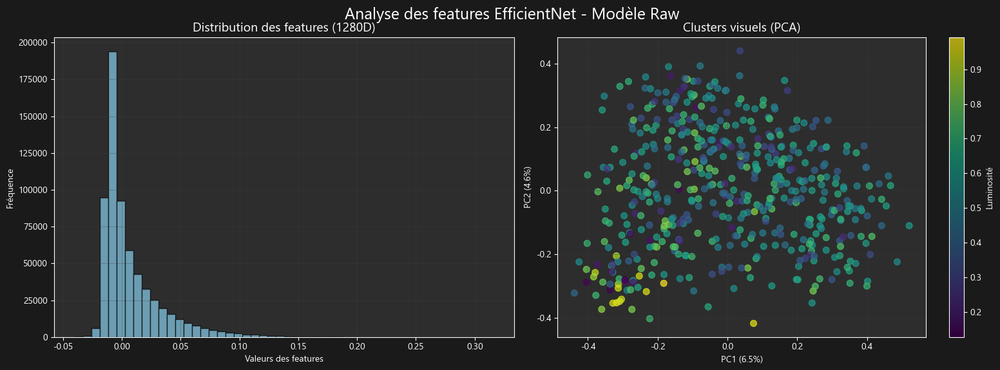


Statistiques:
Échantillons analysés: 500
Dimensions: 1280 features EfficientNet
Variance expliquée: 11.1%
Luminosité moyenne: 0.56

Note: Features génériques ImageNet sans apprentissage spécifique aux recettes


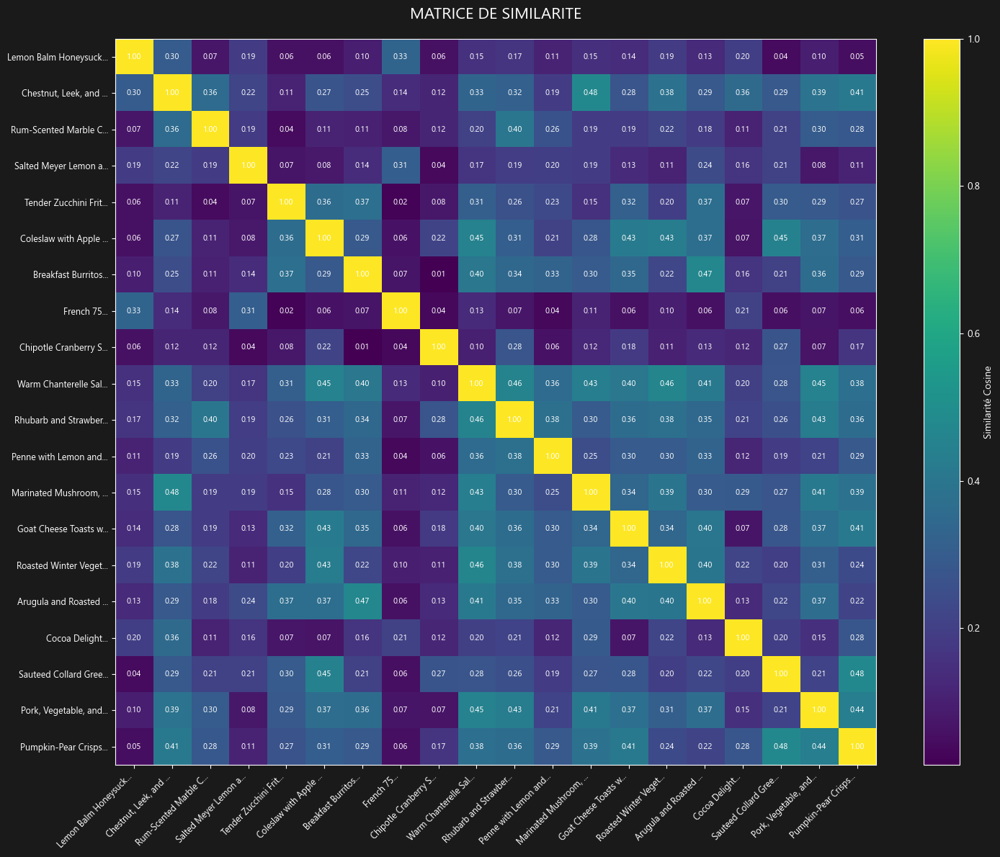

Matrice de similarité pour 20 recettes


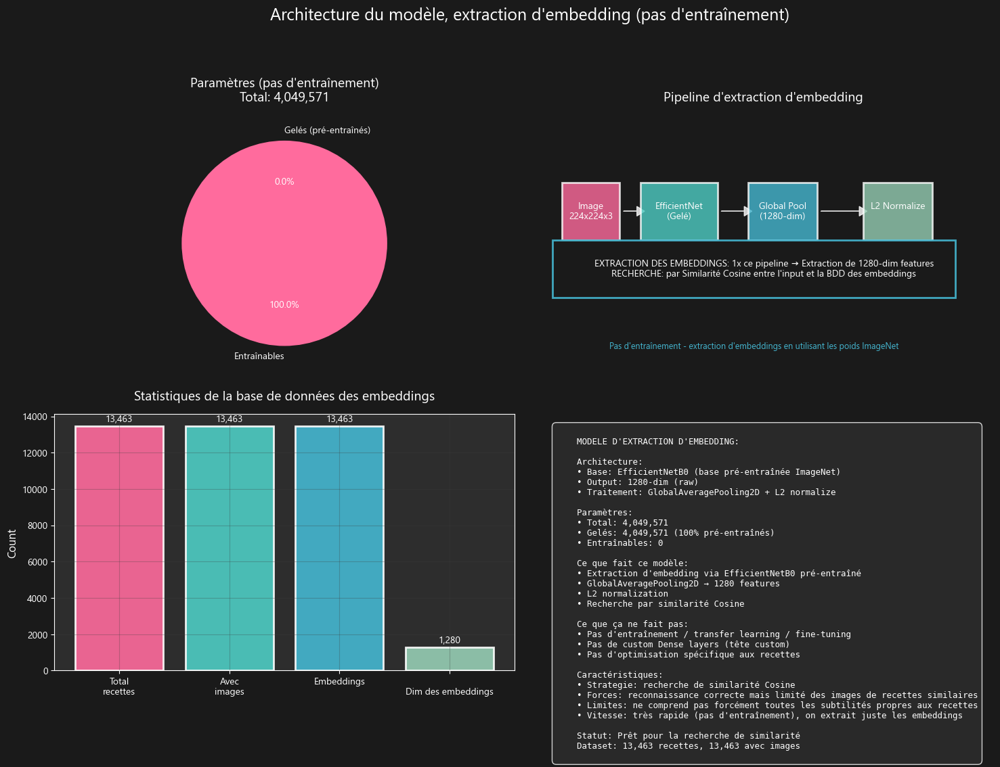

In [10]:
retrieval_system.visualize_embedding_space()
retrieval_system.visualize_similarity_matrix()
retrieval_system.visualize_model_architecture()

##  10. Sauvegarde complète du système

In [11]:
import pickle
  
def save_complete_system(retrieval_system):
    """Save the complete retrieval system"""
    print(" Saving complete retrieval system...")
    
    # Sauvegarde du modèle
    retrieval_system.model.save("./raw/embeddings_recipe_image_retrieval_model_raw.keras")
    print("Modèle sauvegardé: ./raw/embeddings_recipe_image_retrieval_model_raw.keras")
    
    # Sauvegarde de la base de données des embeddings
    database_path = "./raw/recipe_embeddings_database_raw"
    metadata_path = "./raw/recipe_embeddings_database_metadata_raw"
    np.save(f"{database_path}.npy", retrieval_system.embeddings_db)
    print(f"Embeddings sauvegardés: {database_path}.npy ({retrieval_system.embeddings_db.shape})")

    # Sauvegarde des métadonnées (en utilisant les attributs actuels)
    metadata = {
        'image_paths': retrieval_system.image_paths,
        'image_to_recipe_map': retrieval_system.image_to_recipe_map
    }
    with open(f"{metadata_path}.pkl", 'wb') as f:
        pickle.dump(metadata, f)
    print(f"Metadata sauvegardées: ./raw/recipe_embeddings_database_metadata_raw.pkl")
    
    # Sauvegarde du DataFrame 'recipes_with_images'
    recipes_df_path = "./data/recipes_with_images_dataframe.pkl"
    retrieval_system.recipes_df.to_pickle(recipes_df_path)
    print(f"DataFrame 'recipes_with_images' sauvegardé: {recipes_df_path}")
    
    model_size = os.path.getsize("./raw/embeddings_recipe_image_retrieval_model_raw.keras") / (1024**2)
    embeddings_size = os.path.getsize(f"{database_path}.npy") / (1024**2)
    metadata_size = os.path.getsize(f"{metadata_path}.pkl") / (1024**2)
    df_size = os.path.getsize(recipes_df_path) / (1024**2)
    
    print(f"\nTaille des fichiers:")
    print(f"Model: {model_size:.1f} MB")
    print(f"Embeddings: {embeddings_size:.1f} MB") 
    print(f"Metadata: {metadata_size:.1f} MB")
    print(f"    DataFrame: {df_size:.1f} MB")
    
    print(f"\nSauvegarde complète du modèle et des {len(retrieval_system.embeddings_db):,} embeddings effectuée!")

save_complete_system(retrieval_system)

 Saving complete retrieval system...
Modèle sauvegardé: ./raw/embeddings_recipe_image_retrieval_model_raw.keras
Embeddings sauvegardés: ./raw/recipe_embeddings_database_raw.npy ((13463, 1280))
Metadata sauvegardées: ./raw/recipe_embeddings_database_metadata_raw.pkl
DataFrame 'recipes_with_images' sauvegardé: ./data/recipes_with_images_dataframe.pkl

Taille des fichiers:
Model: 16.2 MB
Embeddings: 65.7 MB
Metadata: 22.2 MB
    DataFrame: 73.2 MB

Sauvegarde complète du modèle et des 13,463 embeddings effectuée!


## 11. Test du recherche avec une image aléatoire du dataset

Utilisation du système existant en mémoire

Test avec une image aléatoire du dataset...
Test avec une image aléatoire: C:\Users\Naturel\.cache\kagglehub\datasets\pes12017000148\food-ingredients-and-recipe-dataset-with-images\versions\1\Food Images\Food Images\arugula-and-ricotta-calzones-233791.jpg
Recherche de 3 recettes similaires...
3 recipes similaires trouvées


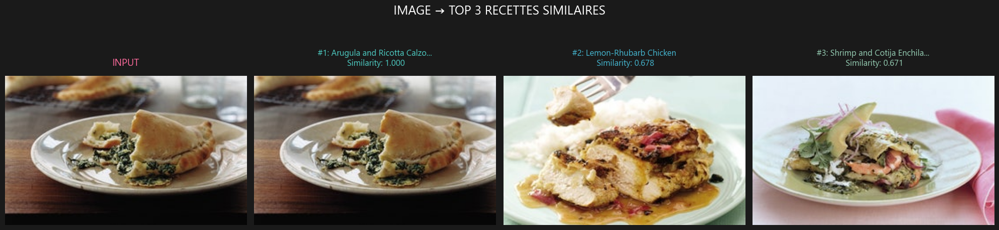


RECETTES SIMILAIRES

RANG #1: 1.0000
Arugula and Ricotta Calzones
------------------------------------------------------------
Ingredients:
['1 large garlic clove, minced', '2 tablespoons extra-virgin olive oil', '5 oz baby arugula (8 cups packed)', '6 oz whole-milk ricotta (2/3 cup)', '3 oz whole-milk mozzarella, coarsely grated', '2 tablespoonsfinely grated Parmigiano-Reggiano', '1 large egg yolk', '1/4 teaspoon salt', '1/8 teaspoon b...
------------------------------------------------------------
Instructions:
Put oven rack in lower third of oven and preheat oven to 450°F.
Cook garlic in oil in a 12-inch heavy skillet over moderate heat, stirring frequently, until golden, 1 to 2 minutes. Add arugula and cook, stirring frequently, until wilted, 2 to 3 minutes. Transfer to a sieve and press hard on arugula to squeeze out as much excess liquid as possible, then coarsely chop.
Stir together ricotta, mozzare...

RANG #2: 0.6778
Lemon-Rhubarb Chicken
-------------------------------------

In [12]:
# Test avec une image aléatoire du dataset
# Si possible, on recharge le système depuis les fichiers sauvegardés => parfait pour préparer le déploiement

import tensorflow as tf
import pickle
import numpy as np
import os
import pandas as pd

def l2_norm(x):
    return tf.nn.l2_normalize(x, axis=1)

def same_shape(x):
    return x

CONFIG_STANDALONE = {
    'IMG_SIZE': 224,
}

def ensure_retrieval_system():
    """Init du système de recherche avec chargement depuis les fichiers sauvegardés si possible"""
    global retrieval_system
    
    # On vérifie si le système existe déjà et est prêt
    if 'retrieval_system' in globals() and retrieval_system is not None and retrieval_system.embeddings_db is not None:
        print("Utilisation du système existant en mémoire")
        return True
    
    print("Chargement du système depuis les fichiers sauvegardés...")
    
    try:
      
        # On a besoin des custom l2_norm et same_shape pour le chargement du modèle
        custom_objects = {
            'l2_norm': l2_norm,
            'same_shape': same_shape,
        }
        
        # Chemin du modèle sauvegardé précédemment
        model_paths = [
            "./raw/embeddings_recipe_image_retrieval_model_raw.keras"
        ]
        
        model = None
        for model_path in model_paths:
            if os.path.exists(model_path):
                try:
                    model = tf.keras.models.load_model(model_path,
                                                      compile=False,
                                                      safe_mode=False,
                                                      custom_objects=custom_objects)
                    print(f"Modèle chargé depuis {model_path}")
                    break
                except Exception as e:
                    print(f"Echec de chargement depuis {model_path}: {e}")
                    continue
        
        if model is None:
            print(" Could not load model from any location")
            return False
        
        # Chargement de la base de données des embeddings
        embeddings_db = np.load("./raw/recipe_embeddings_database_raw.npy")
        print(f"Embeddings chargés: {embeddings_db.shape}")
        
        # Chargement des métadonnées
        with open("./raw/recipe_embeddings_database_metadata_raw.pkl", 'rb') as f:
            metadata = pickle.load(f)
        print("Métadonnées chargées")
        
        # Chargement du DataFrame 'recipes_with_images'
        recipes_df_path = "./data/recipes_with_images_dataframe.pkl"
        if os.path.exists(recipes_df_path):
            recipes_with_images = pd.read_pickle(recipes_df_path)
            print(f"DataFrame chargée: {len(recipes_with_images)} recipes")
        else:
            print("Fichier recipes_with_images_dataframe.pkl introuvable!")
            print("Il faut d'abord sauvegarder le DataFrame 'recipes_with_images' dans les cellules précédentes")
            return False
        
        # On crée le système avec les différents éléments chargés
        retrieval_system = RecipeImageRetrieval(model, recipes_with_images)
        retrieval_system.embeddings_db = embeddings_db
        retrieval_system.image_paths = metadata['image_paths']
        retrieval_system.image_to_recipe_map = metadata['image_to_recipe_map']
        
        print(f"Système chargé avec {len(embeddings_db):,} embeddings!")
        return True
            
    except FileNotFoundError as e:
        print(f"Fichier introuvable: {e}")
        print("Vérifiez que ces fichiers existent:")
        print("- ./raw/embeddings_recipe_image_retrieval_model_raw.keras")
        print("- ./raw/recipe_embeddings_database_raw.npy")
        print("- ./raw/recipe_embeddings_database_metadata_raw.pkl")
        print("- ./data/recipes_with_images_dataframe_raw.pkl")
        return False
    except Exception as e:
        print(f"Erreur lors du chargement du système: {e}")
        import traceback
        traceback.print_exc()
        return False

# Main testing logic
if ensure_retrieval_system():
    print("\nTest avec une image aléatoire du dataset...")
    retrieval_system.test_with_random_image(top_k=3)
else:
    print("\nImpossible d'initialiser le système")

## 12. Recherches sur des images inconnues du système


TEST IMAGE 1.jpg
Recherche de 3 recettes similaires...
3 recipes similaires trouvées


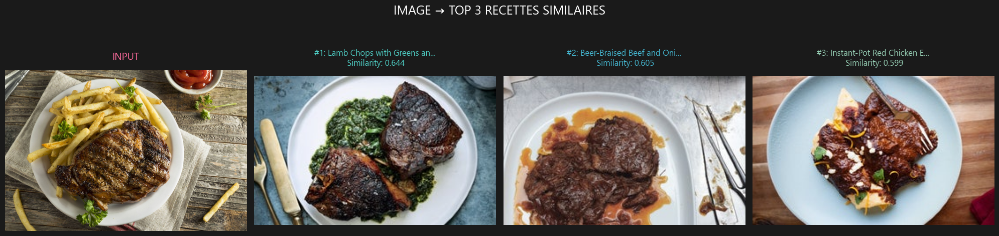


RECETTES SIMILAIRES

RANG #1: 0.6437
Lamb Chops with Greens and Sorrel Salsa Verde
------------------------------------------------------------
Ingredients:
['8 1 1/2-2"-thick lamb loin chops (about 3 pounds)', 'Kosher salt, freshly ground pepper', '2/3 cup sorrel or spinach leaves', '1/3 cup mint leaves', '1/3 cup parsley leaves', '1 tablespoon finely grated lemon zest', '1 teaspoon crushed red pepper flakes', '5 garlic cloves, thinly sliced, divided',...
------------------------------------------------------------
Instructions:
Pat lamb dry; season with salt and pepper. Let sit at room temperature 1 hour.
Meanwhile, puree sorrel, mint, parsley, lemon zest, red pepper flakes, about 1 garlic clove, and 1/3 cup oil in a blender, scraping down sides as needed, until mixture is smooth. Season salsa verde with salt and pepper; set aside.
Prepare grill for high heat (or heat a grill pan over high). Grill chops, turning every 2 ...

RANG #2: 0.6049
Beer-Braised Beef and Onions
-------------

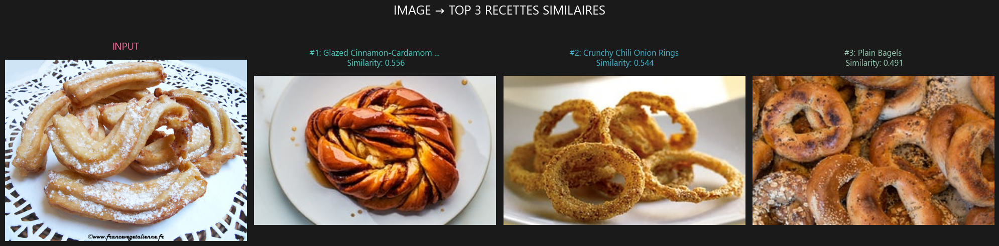


RECETTES SIMILAIRES

RANG #1: 0.5560
Glazed Cinnamon-Cardamom Buns
------------------------------------------------------------
Ingredients:
['1 cup whole milk', '1 Tbsp. active dry yeast', '1 large egg', '1 large egg yolk', '3 1/2 cups (475 g) all-purpose flour', '1/2 cup (105 g) granulated sugar', '1 1/2 tsp. (3 g) ground cardamom', '1 tsp. kosher salt', '6 Tbsp. room temperature unsalted butter, plus more for bowl', '6 Tbsp. unsalted ...
------------------------------------------------------------
Instructions:
Heat milk in a small saucepan over low until just warm; an instant-read thermometer should register 105°F–115°F. Pour into the large bowl of a stand mixer. Whisk in yeast and let sit until foamy, 10–15 minutes. You should see a layer of foam on the surface; this means that the yeast is active.
Add egg, egg yolk, flour, granulated sugar, cardamom, and salt to yeast mixture and mix with dough hook o...

RANG #2: 0.5442
Crunchy Chili Onion Rings
--------------------------------

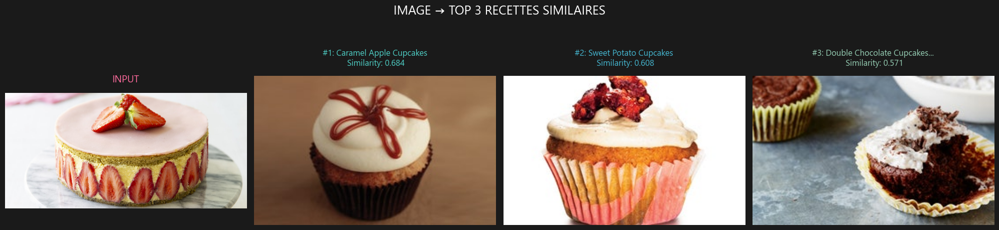


RECETTES SIMILAIRES

RANG #1: 0.6839
Caramel Apple Cupcakes
------------------------------------------------------------
Ingredients:
['2 1/2 cups all-purpose flour', '3 tsp. baking powder', '1 tsp. ground cinnamon', '1/2 tsp. salt', '16 Tbsp. unsalted butter, at room temperature (European style recommended)', '2 cups sugar', '4 large eggs, at room temperature', '1/3 cup hot water', '2 1/2 cups freshly grated apples (4 to 5 medium...
------------------------------------------------------------
Instructions:
Preheat the oven to 350°F. Line a standard cupcake pan with twelve paper baking cups, and a second pan with six baking cups, or grease pans with butter if not using baking cups.
Sift together the flour, baking powder, cinnamon, and salt on a sheet of parchment paper or wax paper and set aside.
Place the butter in the bowl of a stand mixer or in a bowl with a handheld electric mixer. Beat on medium...

RANG #2: 0.6076
Sweet Potato Cupcakes
-------------------------------------------

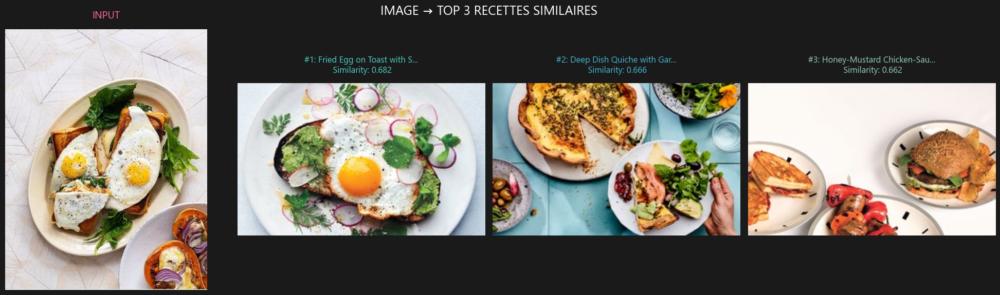


RECETTES SIMILAIRES

RANG #1: 0.6819
Fried Egg on Toast with Salted Herb Butter and Radishes
------------------------------------------------------------
Ingredients:
['3/4 cup mixed tender herbs (such as parsley, dill, basil, chives, and/or tarragon), plus sprigs for serving', '1/2 cup (1 stick) unsalted butter, room temperature, cut into pieces', '1/2 teaspoon finely grated lemon zest', '2 teaspoons fresh lemon juice, plus more for drizzling', '1 teaspoon koshe...
------------------------------------------------------------
Instructions:
Pulse 3/4 cup herbs in a food processor until finely chopped. Add butter, lemon zest, 2 tsp. lemon juice, 1 tsp. salt, and 1/2 tsp. pepper. Pulse to bring together.
Place radishes in a medium bowl; drizzle with a little lemon juice and add a pinch of salt. Toss to combine.
To serve, spread toast with herb butter and top each with a fried egg. Scatter dressed radishes over top along with a few spri...

RANG #2: 0.6660
Deep Dish Quiche with Garnishes


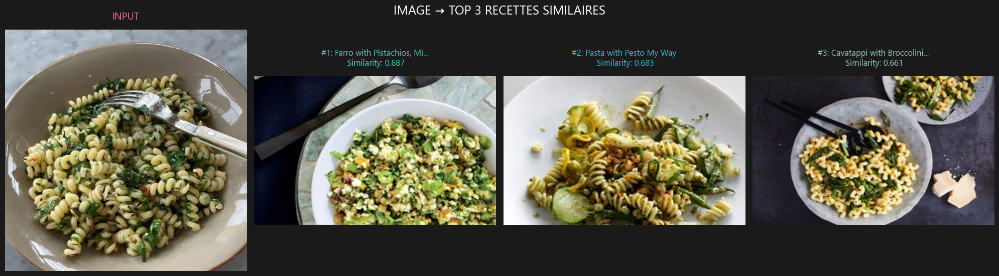


RECETTES SIMILAIRES

RANG #1: 0.6865
Farro with Pistachios, Mixed Herbs, and Golden Raisins
------------------------------------------------------------
Ingredients:
['2 cups farro', '1/2 teaspoon kosher salt, plus more', '1/2 cup pistachios', '1 1/2 teaspoons finely grated lemon zest', '3 tablespoons fresh lemon juice', '1 teaspoon finely grated peeled ginger', '1/2 teaspoon sugar', '1/3 cup grapeseed oil or olive oil', 'Freshly ground black pepper', '1 serrano...
------------------------------------------------------------
Instructions:
Preheat oven to 350°F. Rinse farro under cold water. Cook in a large pot of boiling salted water, skimming surface occasionally, until tender, 20–25 minutes.
Meanwhile, toast pistachios on a rimmed baking sheet, tossing once, until golden brown, 8–10 minutes. Let cool, then coarsely chop.
Whisk lemon zest, lemon juice, ginger, sugar, and 1/2 tsp. salt in a medium bowl. Whisking constantly, gradual...

RANG #2: 0.6827
Pasta with Pesto My Way
---------

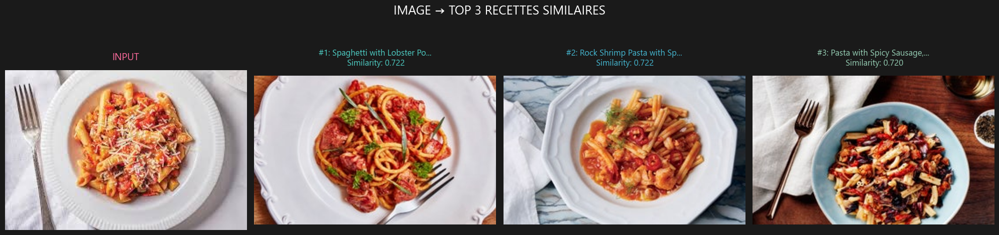


RECETTES SIMILAIRES

RANG #1: 0.7219
Spaghetti with Lobster Pomodoro
------------------------------------------------------------
Ingredients:
['Kosher salt', '2 (1 1/4-lb.) live lobsters', '2 Tbsp. extra-virgin olive oil', '2 Tbsp. ghee or unsalted butter', '1/4 small red onion, thinly sliced', '3 garlic cloves, thinly sliced', '2 sprigs basil', '1 (14-oz.) can whole peeled San Marzano tomatoes', '12 oz. spaghetti', '4 oz. nduja, broken i...
------------------------------------------------------------
Instructions:
Bring a large pot of salted water to a rolling boil. Working one at a time, cook lobsters 3 minutes, then transfer to a large bowl of ice water. Let cool just until you can comfortably handle them, about 1 minute, then twist off claws where the knuckles meet the body and return them to pot of boiling water. Cook 2 minutes (leave bodies in ice water). Add claws back to ice water and let both claws ...

RANG #2: 0.7216
Rock Shrimp Pasta with Spicy Tomato Sauce
--------------

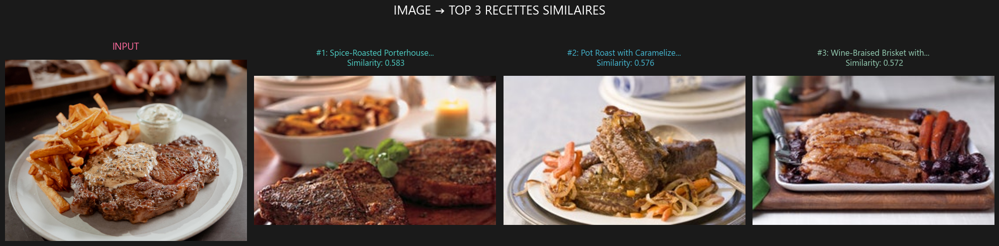


RECETTES SIMILAIRES

RANG #1: 0.5833
Spice-Roasted Porterhouse Steaks
------------------------------------------------------------
Ingredients:
['Two 2-inch-thick porterhouse steaks', 'Olive oil', '1 1/2 tablespoons Coriander-Herb Spice Rub']
------------------------------------------------------------
Instructions:
Place two 2-inch-thick porterhouse steaks on a heavy rimmed baking sheet. Brush both sides with a full-flavored olive oil, then rub 1 1/2 tablespoons of the Coriander-Herb Spice Rub into each side of each steak.
Preheat the oven to 450°F. Roast steaks until a meat thermometer inserted into the center registers 125°F for rare, about 25 minutes. Transfer the steaks to a cutting board, cover loosely ...

RANG #2: 0.5763
Pot Roast with Caramelized Onions and Roasted Carrots
------------------------------------------------------------
Ingredients:
['1/2 cup canola oil', 'Kosher salt and freshly ground black pepper', '5 pounds boneless short ribs, denuded (all surface fat remove

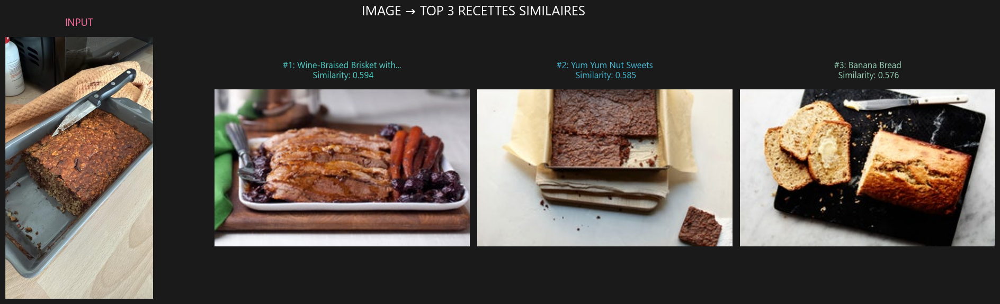


RECETTES SIMILAIRES

RANG #1: 0.5943
Wine-Braised Brisket with Tart Cherries
------------------------------------------------------------
Ingredients:
["1/4 cup matzoh cake meal (see Cooks' notes)", 'Kosher or fine salt', 'Freshly ground black pepper', '1 (6- to 6 1/2-pound) first- or second-cut beef brisket', '3 to 4 tablespoons vegetable oil', '16 medium shallots (about 1 pound); peeled, leaving root ends intact', '3 large garlic cloves, finely ...
------------------------------------------------------------
Instructions:
Heat oven to 350°F with rack in middle.
Whisk together matzoh meal with 1 tablespoon kosher salt (2 teaspoons fine) and 1/2 teaspoon pepper. Pat brisket dry and dredge in matzoh mixture, shaking off excess.
Set roasting pan across 2 burners and in it heat 3 tablespoons oil over medium-high heat until oil shimmers. Brown brisket (fat side down first if using first cut) on both sides, 3 to 5 minutes...

RANG #2: 0.5848
Yum Yum Nut Sweets
-----------------------------

In [13]:
import tensorflow as tf
import numpy as np

if 'retrieval_system' not in globals() or retrieval_system.embeddings_db is None:
    print("Chargement du système sauvegardé...")
    
    try:
       # Chargement du modèle
        model = tf.keras.models.load_model("./raw/recipe_image_retrieval_model_raw.keras")
        embeddings_db = np.load("./raw/recipe_embeddings_database_raw.npy")
        
        import pickle
        with open("./raw/recipe_embeddings_database_metadata_raw.pkl", 'rb') as f:
            metadata = pickle.load(f)
        
        # On crée le système avec les différents éléments chargés
        retrieval_system = RecipeImageRetrieval(model, recipes_with_images)
        retrieval_system.embeddings_db = embeddings_db
        retrieval_system.image_paths = metadata['image_paths']
        retrieval_system.image_to_recipe_map = metadata['image_to_recipe_map']
        
    except FileNotFoundError:
        print("Aucun système sauvegardé trouvé.")
        retrieval_system = None
    except Exception as e:
        print(f"Erreur lors du chargement: {e}")
        retrieval_system = None

if retrieval_system and retrieval_system.embeddings_db is not None:
    # Test sur les images 1.jpg à 8.jpg
    import os
    for i in range(1, 9):
        test_image = f"./test_recipes/{i}.jpg"
        
        if os.path.exists(test_image):
            print(f"\n{'='*50}")
            print(f"TEST IMAGE {i}.jpg")
            print(f"{'='*50}")
            
            results = retrieval_system.search_similar_recipes(test_image, top_k=3)
            if results:
                retrieval_system.display_results(test_image, results)
            else:
                print("Aucun résultat trouvé")
        else:
            print(f"Image {i}.jpg introuvable")
    
else:
    print("Système non disponible")